In [ ]:
import tensorflow as tf
from keras.layers import (
    Dense,
    Input,
    GlobalAveragePooling2D,
    Dropout,
    BatchNormalization,
    UpSampling2D,
    Conv2D,
    MaxPooling2D,
    AveragePooling2D,
    Flatten,
    Concatenate,
)
from tensorflow.keras.optimizers import Adam
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import CSVLogger
from keras.models import Model
from tensorflow.keras.applications import MobileNet, MobileNetV2
from tensorflow import keras

# import tensorflow_model_optimization as tfmot
from keras import backend as K
from tqdm import tqdm
import os
import sys
import numpy as np
import h5py
import matplotlib.pyplot as plt
import cv2
from module.const import *
from module import func, loss
import random

# データセット作成

  0%|          | 0/1080 [00:00<?, ?it/s]

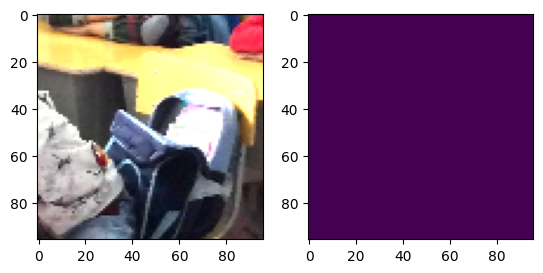

  0%|          | 1/1080 [00:00<06:19,  2.84it/s]

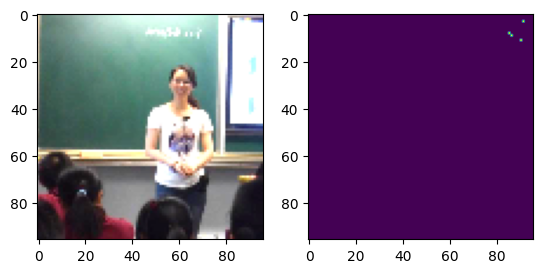

  0%|          | 2/1080 [00:00<06:08,  2.92it/s]

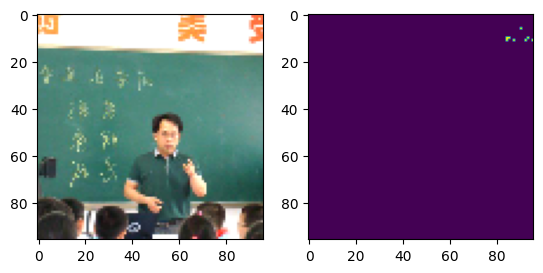

  0%|          | 3/1080 [00:01<06:02,  2.97it/s]

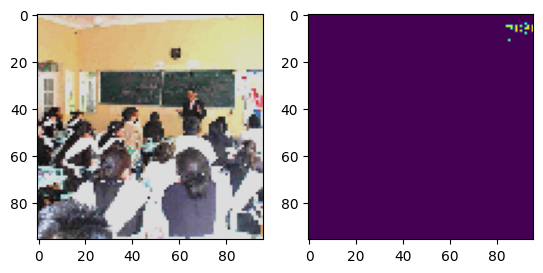

  0%|          | 4/1080 [00:01<06:59,  2.57it/s]

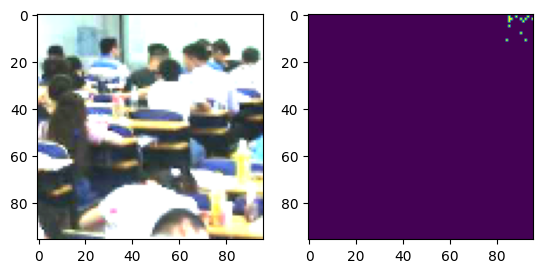

  0%|          | 5/1080 [00:01<06:34,  2.72it/s]

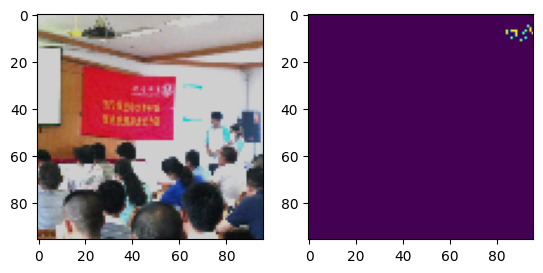

  1%|          | 6/1080 [00:02<06:19,  2.83it/s]

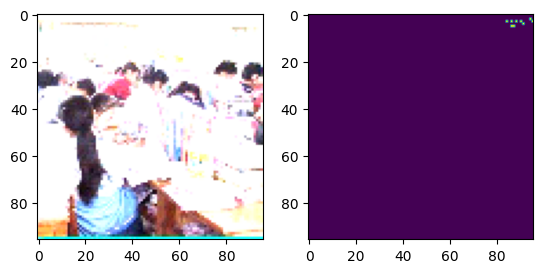

  1%|          | 7/1080 [00:02<06:18,  2.84it/s]

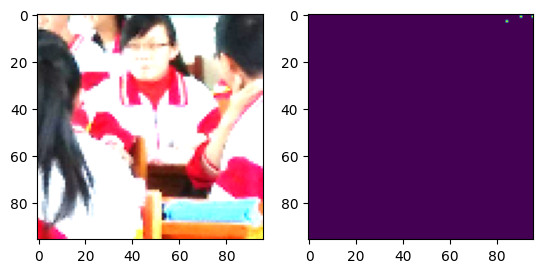

  1%|          | 8/1080 [00:02<06:09,  2.90it/s]

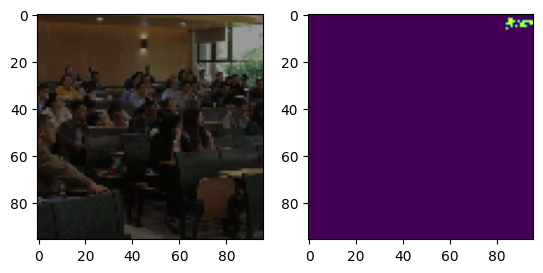

  1%|          | 9/1080 [00:03<06:04,  2.94it/s]

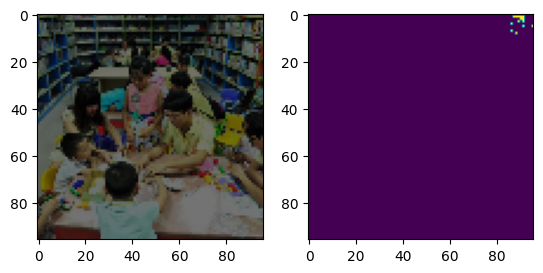

  1%|          | 10/1080 [00:03<06:02,  2.95it/s]

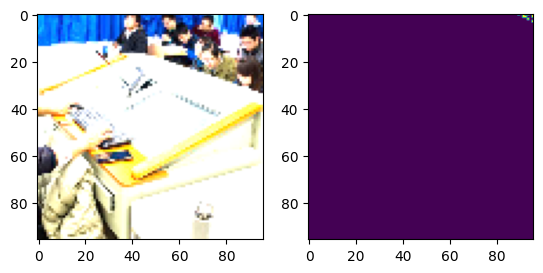

  1%|          | 11/1080 [00:03<05:57,  2.99it/s]

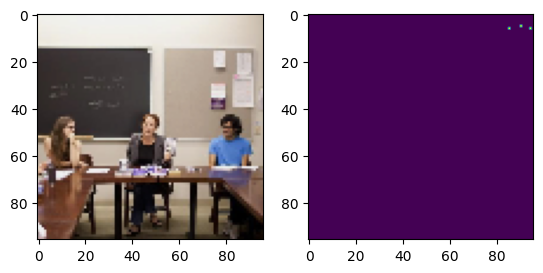

  1%|          | 12/1080 [00:04<05:55,  3.01it/s]

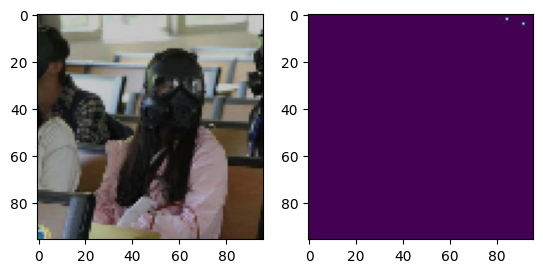

  1%|          | 13/1080 [00:04<05:54,  3.01it/s]

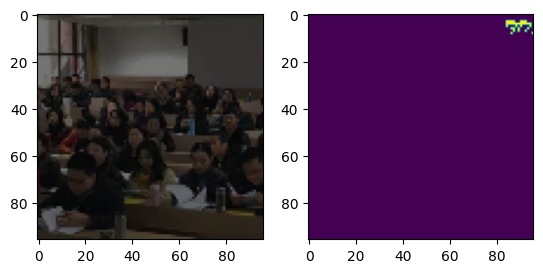

  1%|▏         | 14/1080 [00:04<05:52,  3.03it/s]

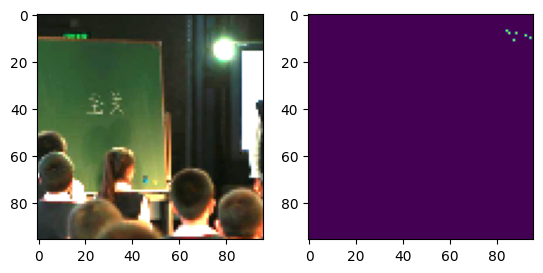

  1%|▏         | 15/1080 [00:05<05:52,  3.02it/s]

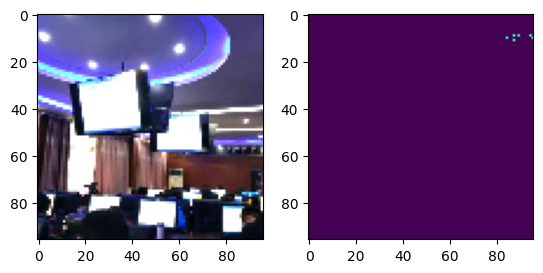

  1%|▏         | 16/1080 [00:05<05:54,  3.00it/s]

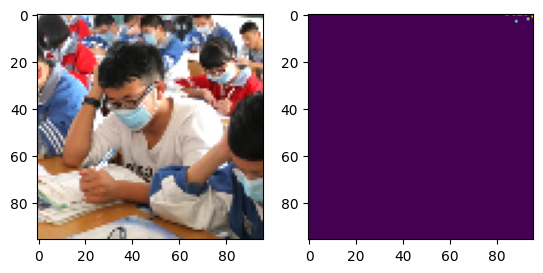

  2%|▏         | 17/1080 [00:05<06:00,  2.95it/s]

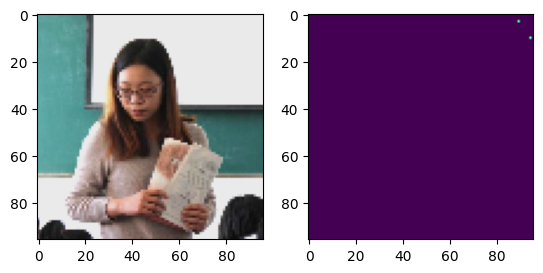

  2%|▏         | 18/1080 [00:06<05:56,  2.98it/s]

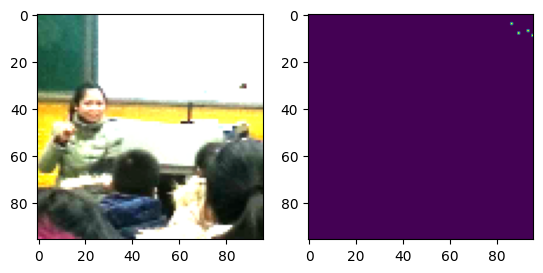

  2%|▏         | 19/1080 [00:06<05:54,  2.99it/s]

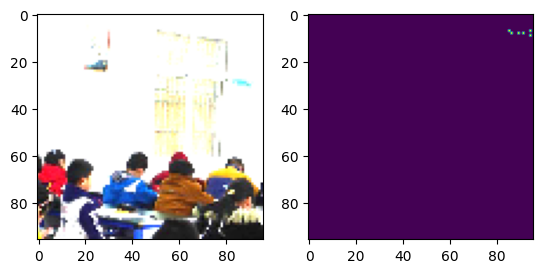

  2%|▏         | 20/1080 [00:06<05:52,  3.01it/s]

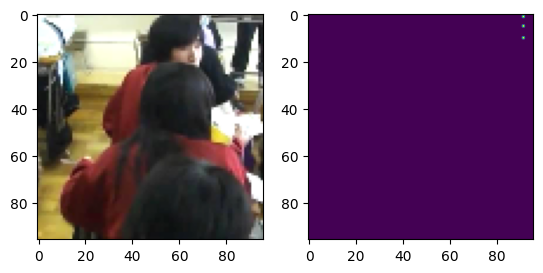

  2%|▏         | 21/1080 [00:07<05:52,  3.01it/s]

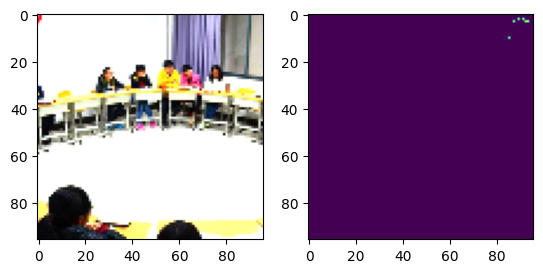

  2%|▏         | 22/1080 [00:07<05:49,  3.03it/s]

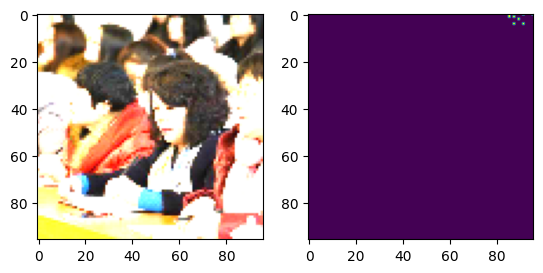

  2%|▏         | 23/1080 [00:07<05:48,  3.03it/s]

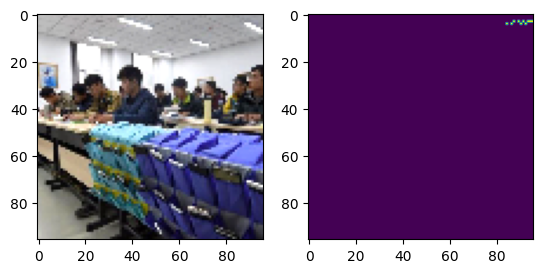

  2%|▏         | 24/1080 [00:08<05:48,  3.03it/s]

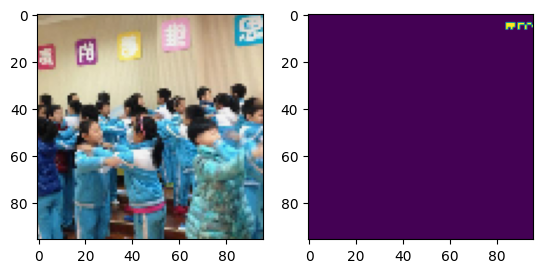

  2%|▏         | 25/1080 [00:08<05:51,  3.00it/s]

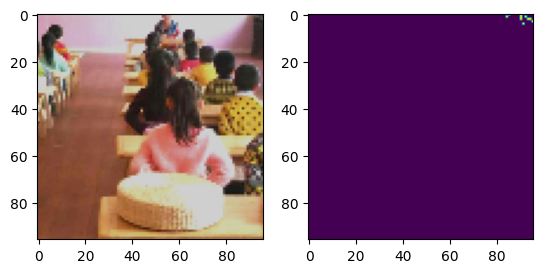

  2%|▏         | 26/1080 [00:08<05:55,  2.97it/s]

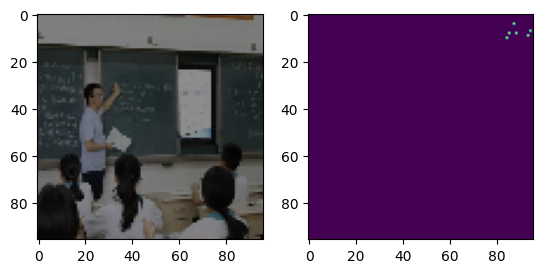

  2%|▎         | 27/1080 [00:09<05:52,  2.99it/s]

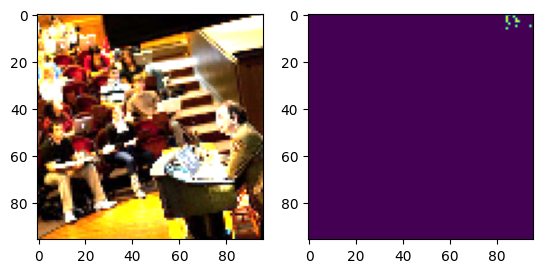

  3%|▎         | 28/1080 [00:09<05:50,  3.00it/s]

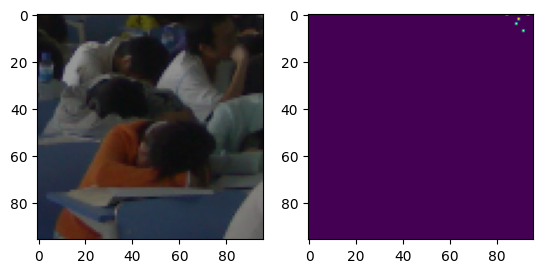

  3%|▎         | 29/1080 [00:09<06:51,  2.55it/s]

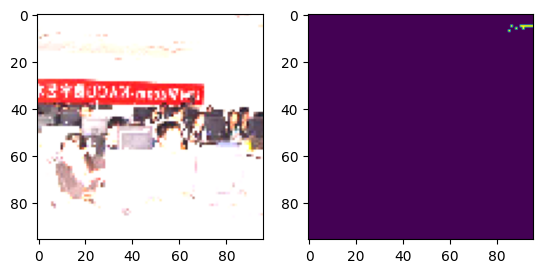

  3%|▎         | 30/1080 [00:10<06:29,  2.70it/s]

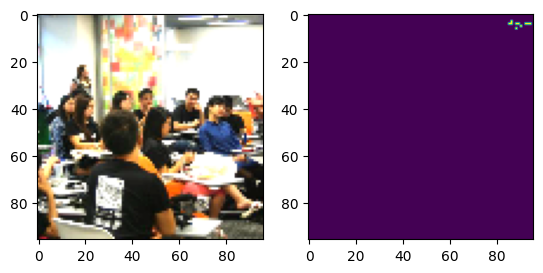

  3%|▎         | 31/1080 [00:10<06:15,  2.79it/s]

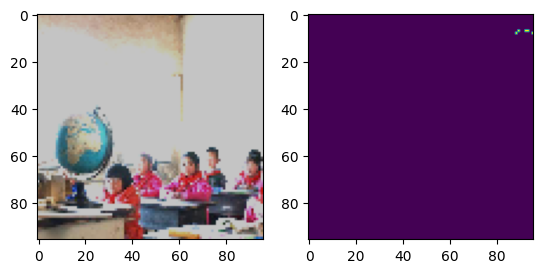

  3%|▎         | 32/1080 [00:10<06:08,  2.84it/s]

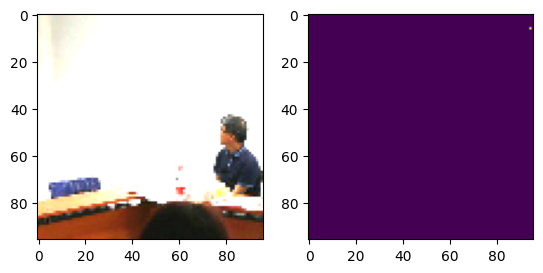

  3%|▎         | 33/1080 [00:11<05:58,  2.92it/s]

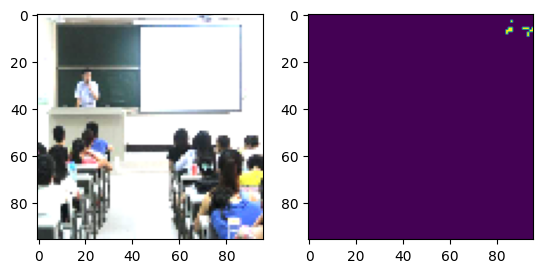

  3%|▎         | 34/1080 [00:11<05:53,  2.96it/s]

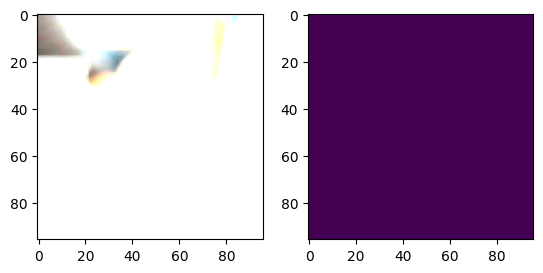

  3%|▎         | 35/1080 [00:11<05:45,  3.02it/s]

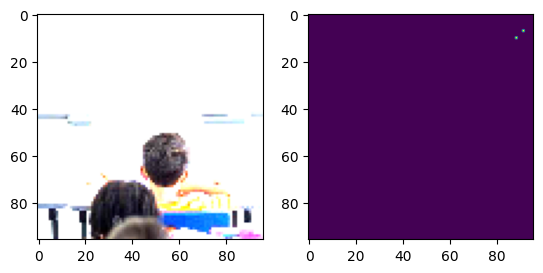

  3%|▎         | 36/1080 [00:12<05:49,  2.99it/s]

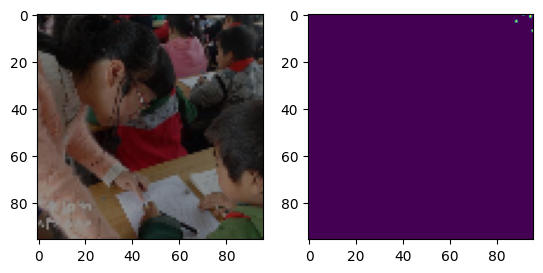

  3%|▎         | 37/1080 [00:12<05:54,  2.94it/s]

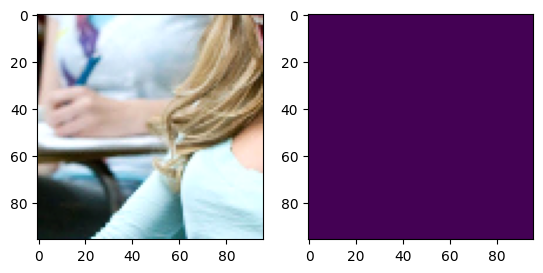

  4%|▎         | 38/1080 [00:12<05:51,  2.97it/s]

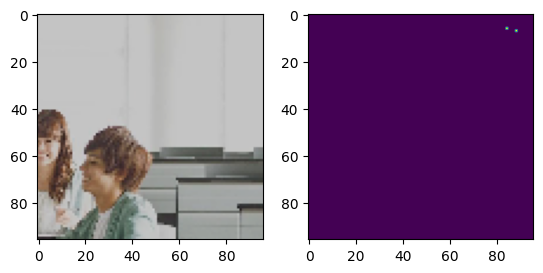

  4%|▎         | 39/1080 [00:13<05:44,  3.02it/s]

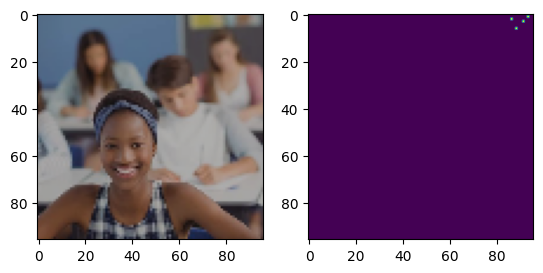

  4%|▎         | 40/1080 [00:13<05:44,  3.02it/s]

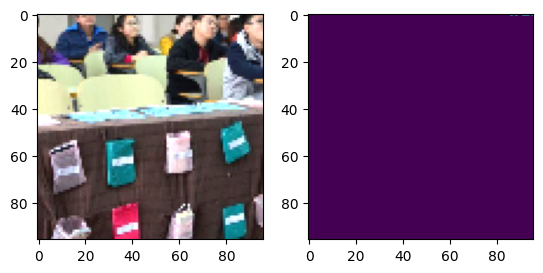

  4%|▍         | 41/1080 [00:13<05:44,  3.01it/s]

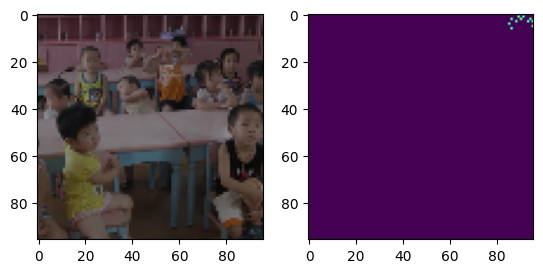

  4%|▍         | 42/1080 [00:14<05:47,  2.99it/s]

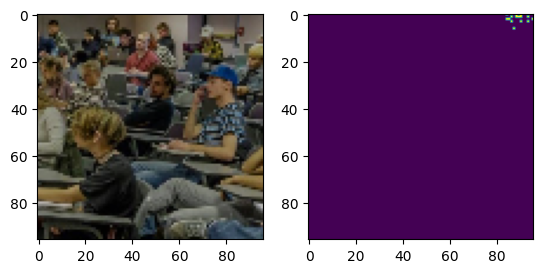

  4%|▍         | 43/1080 [00:14<05:47,  2.99it/s]

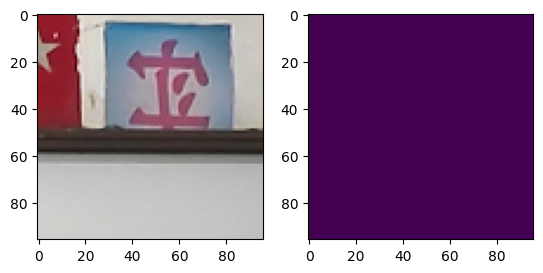

  4%|▍         | 44/1080 [00:14<05:44,  3.01it/s]

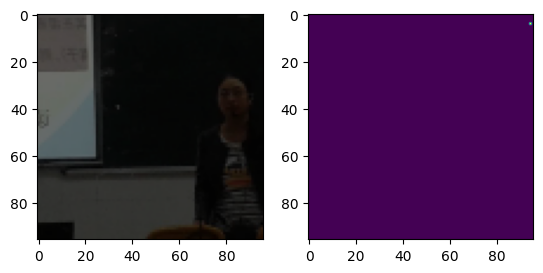

  4%|▍         | 45/1080 [00:15<05:42,  3.02it/s]

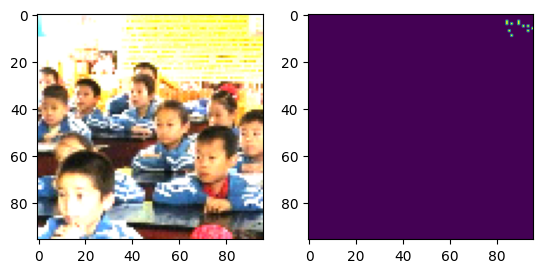

  4%|▍         | 46/1080 [00:15<05:43,  3.01it/s]

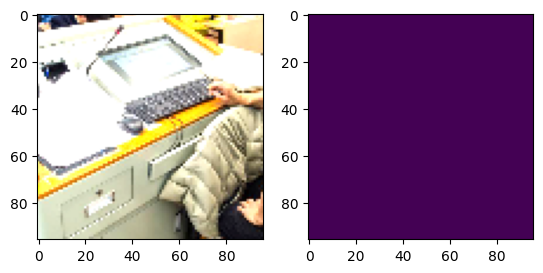

  4%|▍         | 47/1080 [00:15<05:40,  3.04it/s]

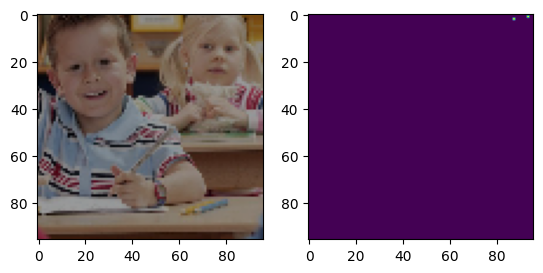

  4%|▍         | 48/1080 [00:16<05:48,  2.96it/s]

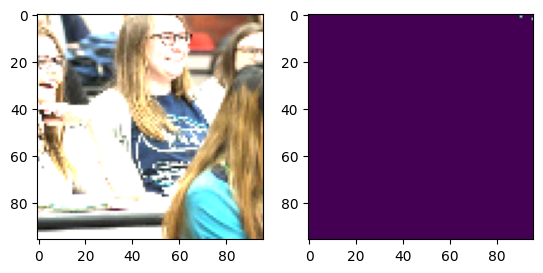

  5%|▍         | 49/1080 [00:16<05:45,  2.98it/s]

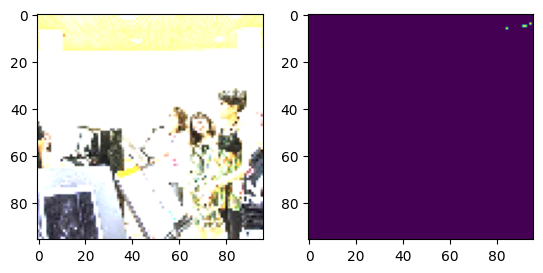

  5%|▍         | 50/1080 [00:16<05:40,  3.02it/s]

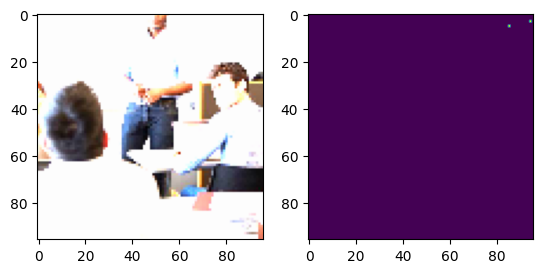

  5%|▍         | 51/1080 [00:17<05:35,  3.06it/s]

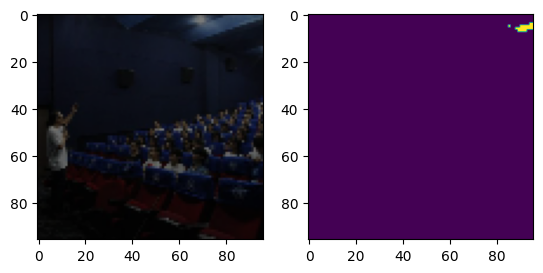

  5%|▍         | 52/1080 [00:17<05:41,  3.01it/s]

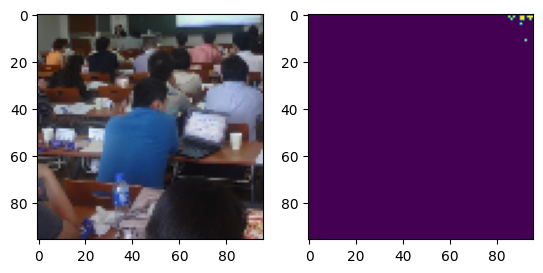

  5%|▍         | 53/1080 [00:17<05:39,  3.02it/s]

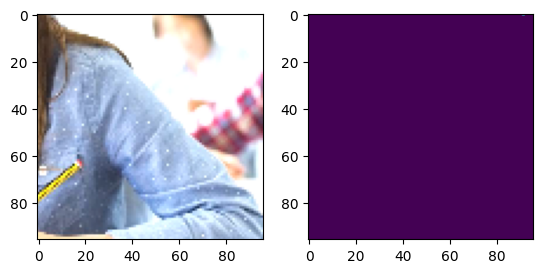

  5%|▌         | 54/1080 [00:18<06:40,  2.56it/s]

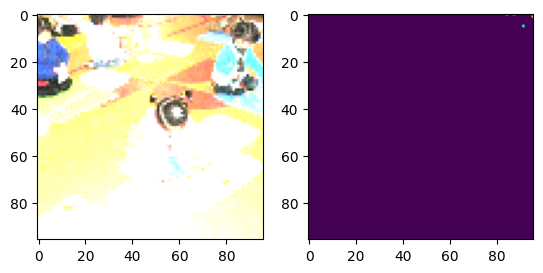

  5%|▌         | 55/1080 [00:18<06:19,  2.70it/s]

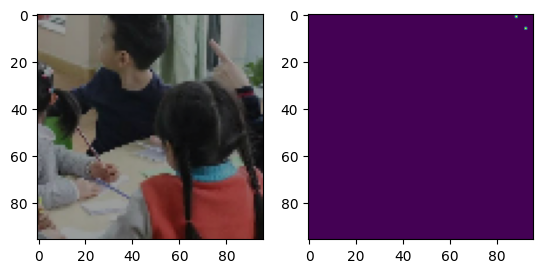

  5%|▌         | 56/1080 [00:19<06:05,  2.80it/s]

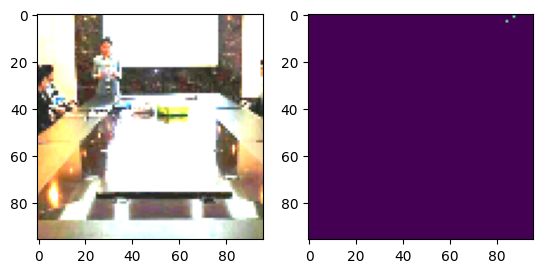

  5%|▌         | 57/1080 [00:19<05:57,  2.86it/s]

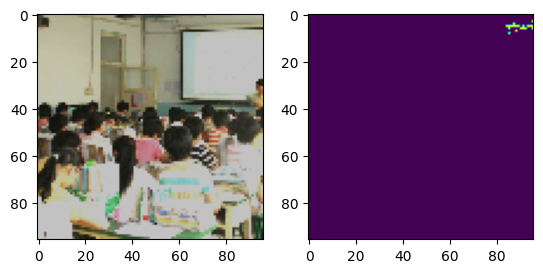

  5%|▌         | 58/1080 [00:19<05:51,  2.91it/s]

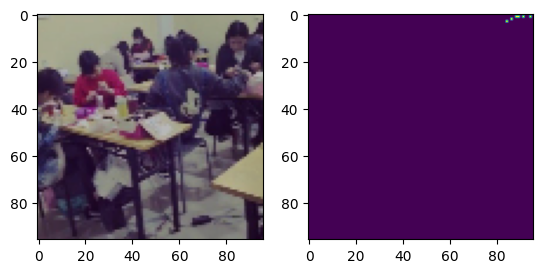

  5%|▌         | 59/1080 [00:20<05:56,  2.86it/s]

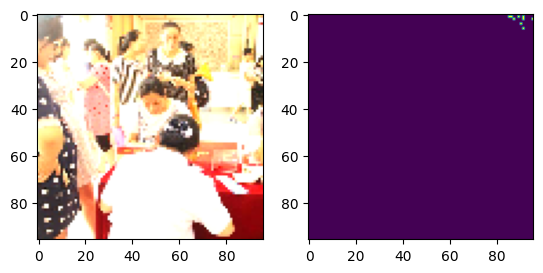

  6%|▌         | 60/1080 [00:20<05:51,  2.90it/s]

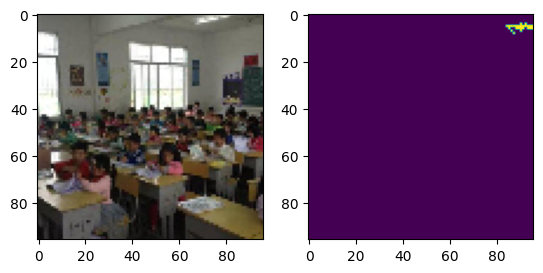

  6%|▌         | 61/1080 [00:20<05:48,  2.93it/s]

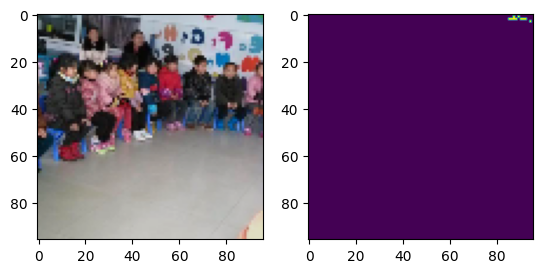

  6%|▌         | 62/1080 [00:21<05:43,  2.97it/s]

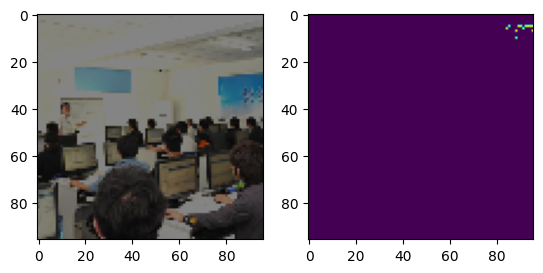

  6%|▌         | 63/1080 [00:21<05:41,  2.98it/s]

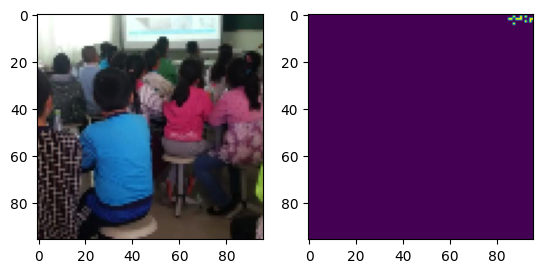

  6%|▌         | 64/1080 [00:21<05:41,  2.98it/s]

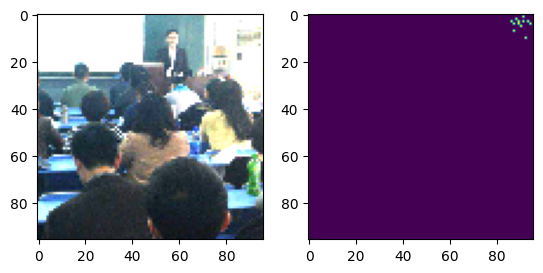

  6%|▌         | 65/1080 [00:22<05:38,  3.00it/s]

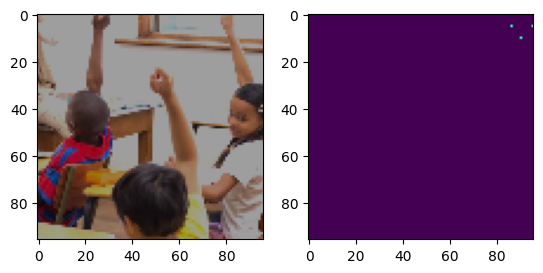

  6%|▌         | 66/1080 [00:22<05:39,  2.99it/s]

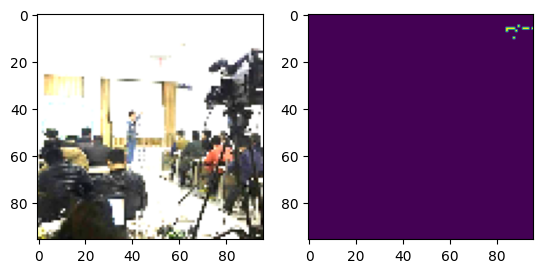

  6%|▌         | 67/1080 [00:22<05:35,  3.01it/s]

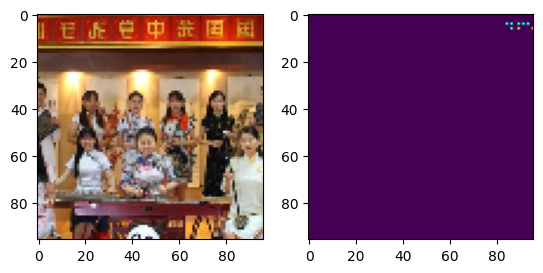

  6%|▋         | 68/1080 [00:23<05:35,  3.01it/s]

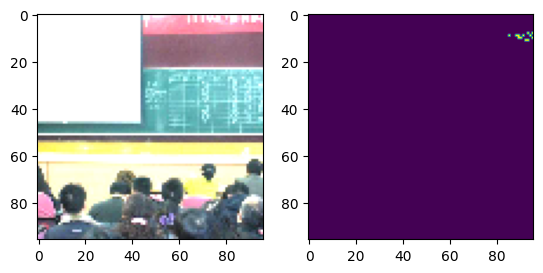

  6%|▋         | 69/1080 [00:23<05:35,  3.01it/s]

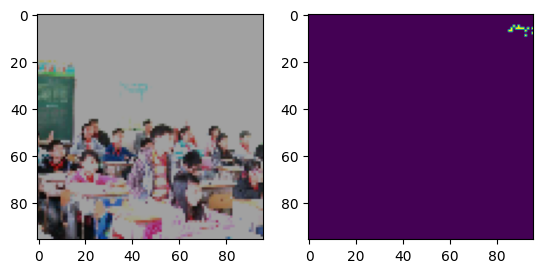

  6%|▋         | 70/1080 [00:23<05:32,  3.04it/s]

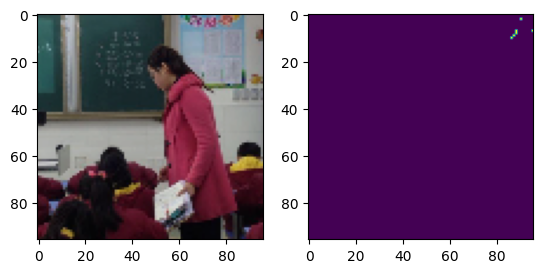

  7%|▋         | 71/1080 [00:24<05:40,  2.96it/s]

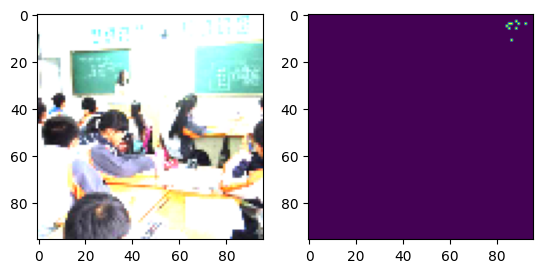

  7%|▋         | 72/1080 [00:24<05:37,  2.99it/s]

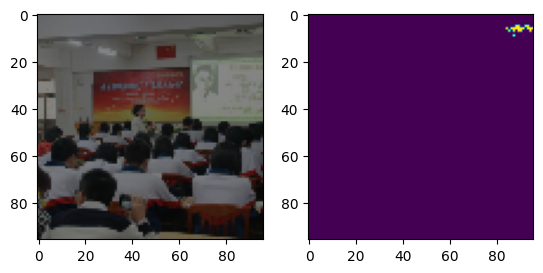

  7%|▋         | 73/1080 [00:24<05:36,  3.00it/s]

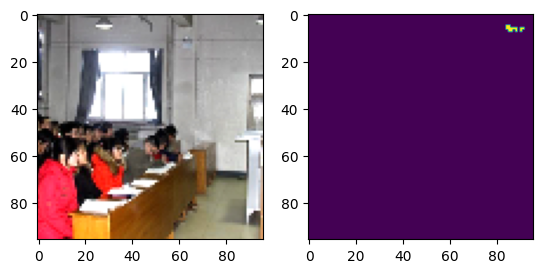

  7%|▋         | 74/1080 [00:25<05:40,  2.95it/s]

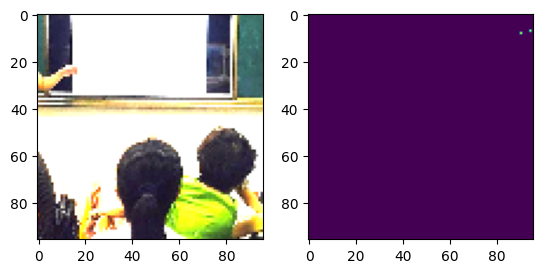

  7%|▋         | 75/1080 [00:25<05:47,  2.89it/s]

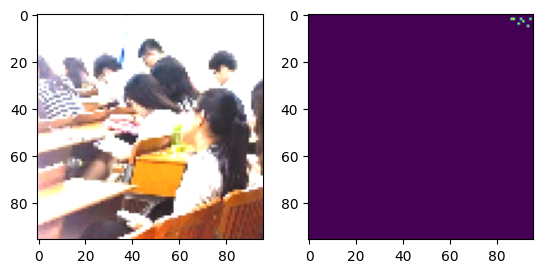

  7%|▋         | 76/1080 [00:25<06:01,  2.78it/s]

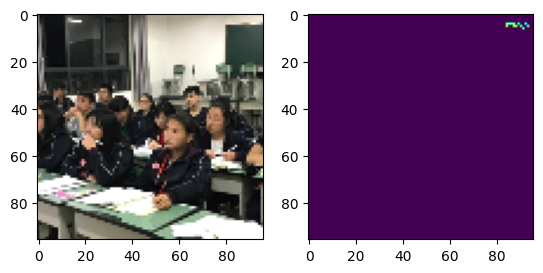

  7%|▋         | 77/1080 [00:26<05:51,  2.86it/s]

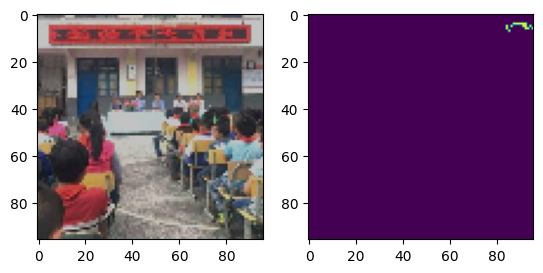

  7%|▋         | 78/1080 [00:26<05:48,  2.87it/s]

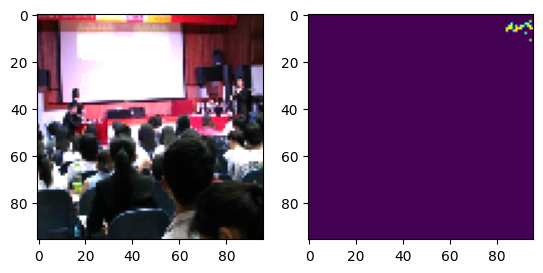

  7%|▋         | 79/1080 [00:27<06:42,  2.49it/s]

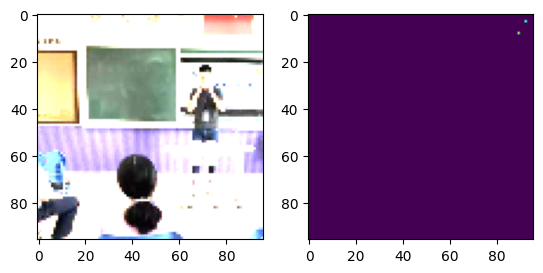

  7%|▋         | 80/1080 [00:27<06:16,  2.65it/s]

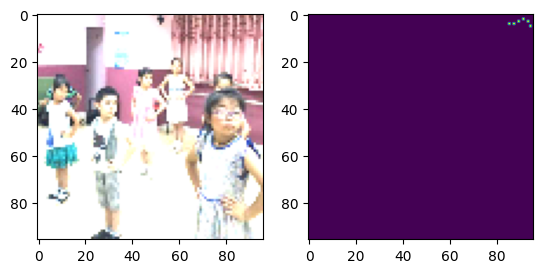

  8%|▊         | 81/1080 [00:27<06:00,  2.77it/s]

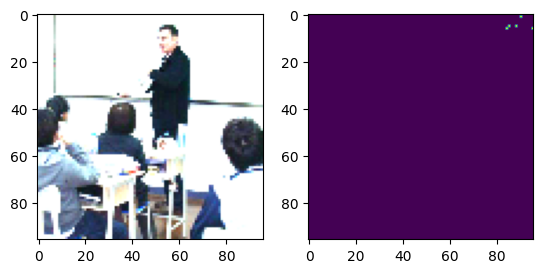

  8%|▊         | 82/1080 [00:28<05:47,  2.87it/s]

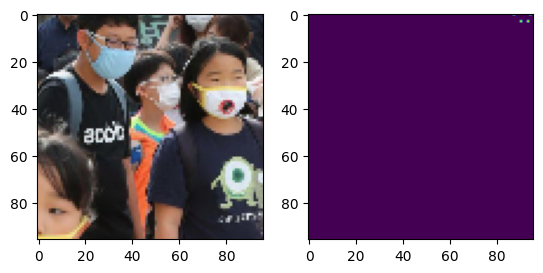

  8%|▊         | 83/1080 [00:28<05:42,  2.91it/s]

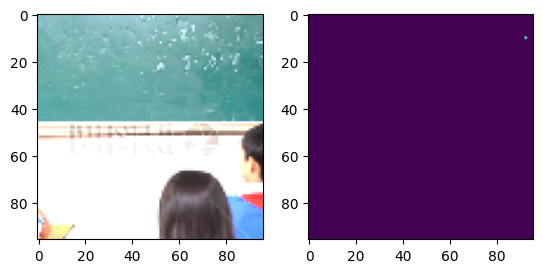

  8%|▊         | 84/1080 [00:28<05:44,  2.89it/s]

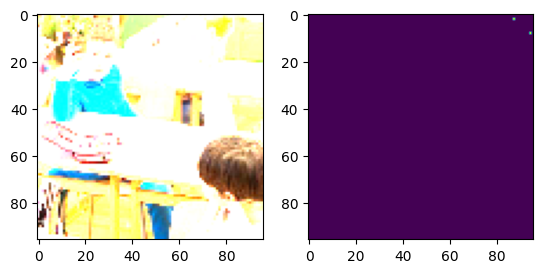

  8%|▊         | 85/1080 [00:29<05:37,  2.95it/s]

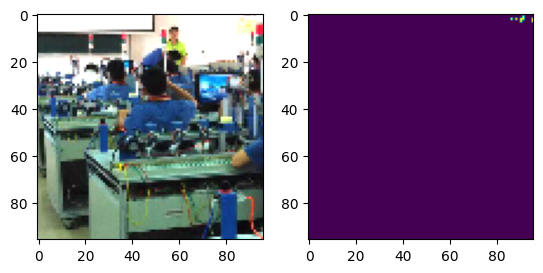

  8%|▊         | 86/1080 [00:29<05:33,  2.98it/s]

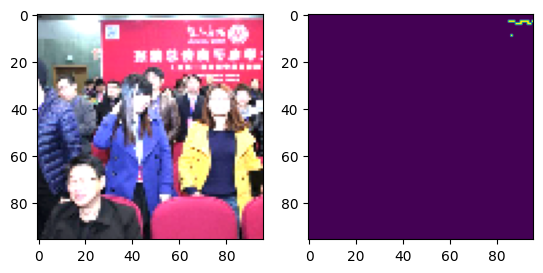

  8%|▊         | 87/1080 [00:29<05:31,  3.00it/s]

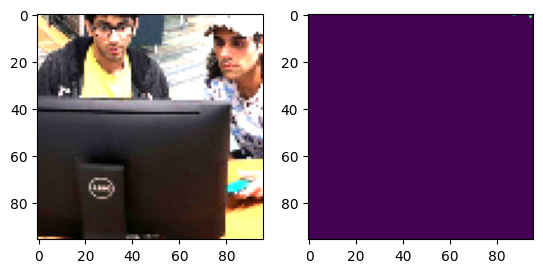

  8%|▊         | 88/1080 [00:30<05:29,  3.01it/s]

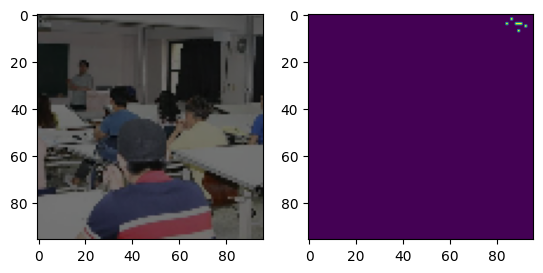

  8%|▊         | 89/1080 [00:30<05:27,  3.03it/s]

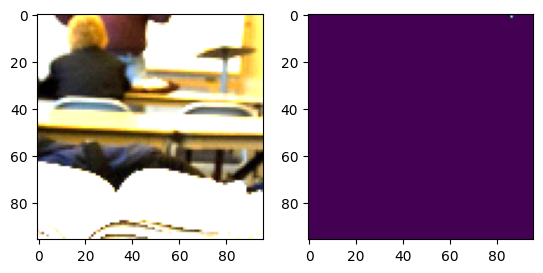

  8%|▊         | 90/1080 [00:30<05:26,  3.03it/s]

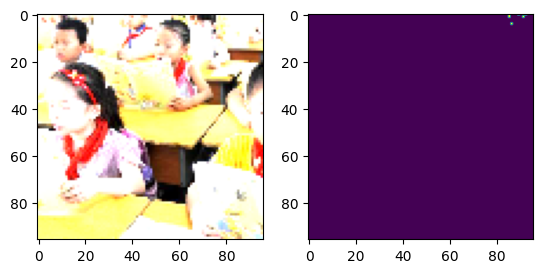

  8%|▊         | 91/1080 [00:31<05:26,  3.03it/s]

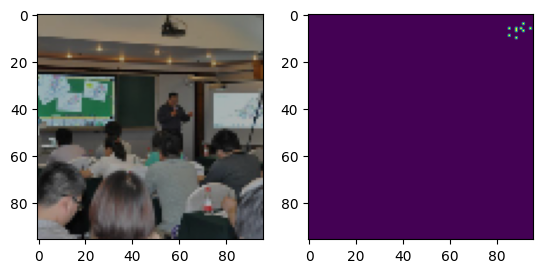

  9%|▊         | 92/1080 [00:31<05:27,  3.02it/s]

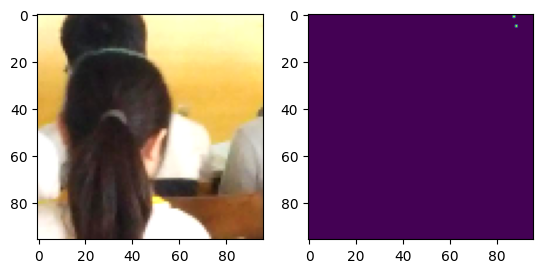

  9%|▊         | 93/1080 [00:31<05:28,  3.01it/s]

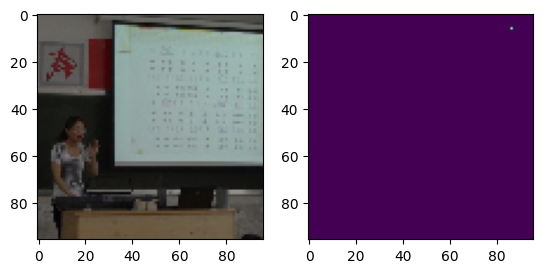

  9%|▊         | 94/1080 [00:32<05:31,  2.97it/s]

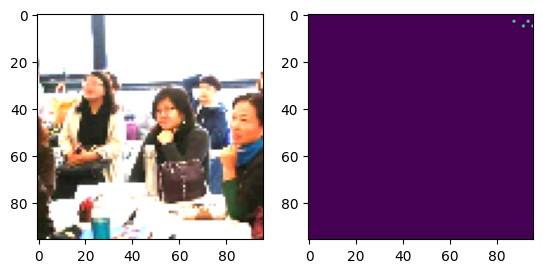

  9%|▉         | 95/1080 [00:32<05:27,  3.00it/s]

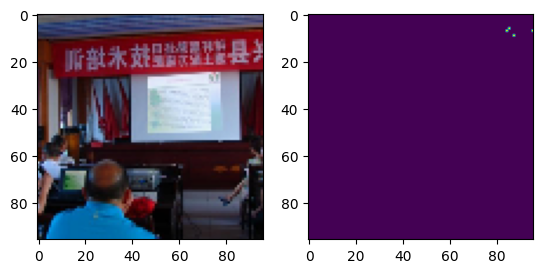

  9%|▉         | 96/1080 [00:32<05:30,  2.98it/s]

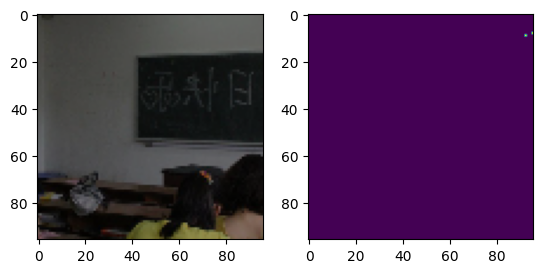

  9%|▉         | 97/1080 [00:33<05:27,  3.00it/s]

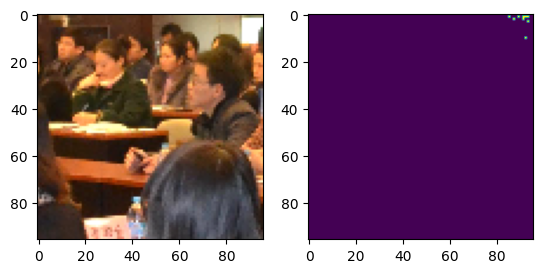

  9%|▉         | 98/1080 [00:33<05:27,  3.00it/s]

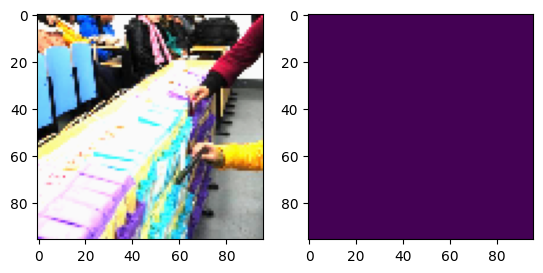

  9%|▉         | 99/1080 [00:33<05:25,  3.01it/s]

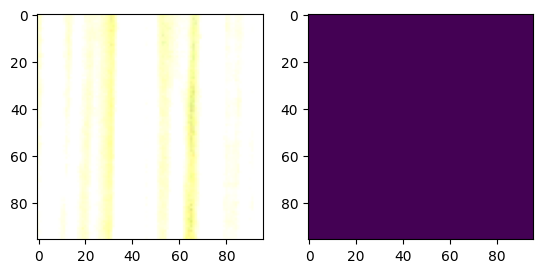

  9%|▉         | 100/1080 [00:34<05:19,  3.07it/s]

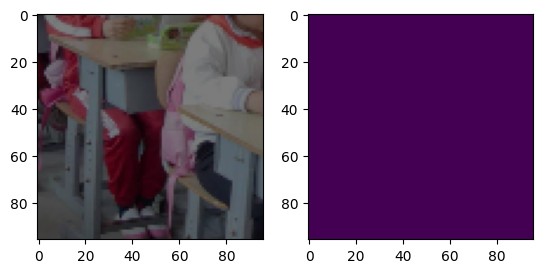

  9%|▉         | 101/1080 [00:34<05:19,  3.06it/s]

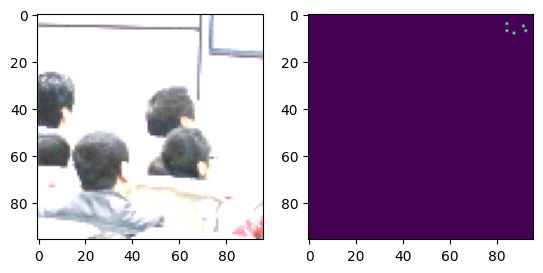

  9%|▉         | 102/1080 [00:34<05:16,  3.09it/s]

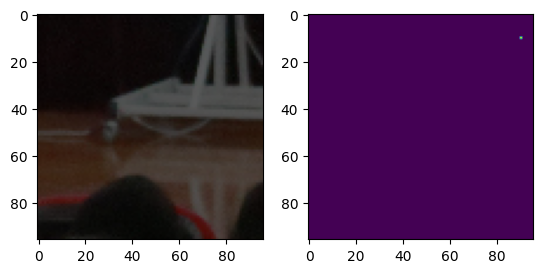

 10%|▉         | 103/1080 [00:35<06:17,  2.59it/s]

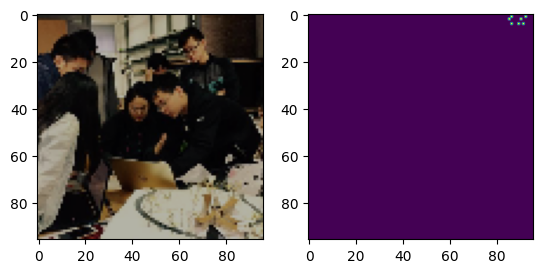

 10%|▉         | 104/1080 [00:35<06:03,  2.68it/s]

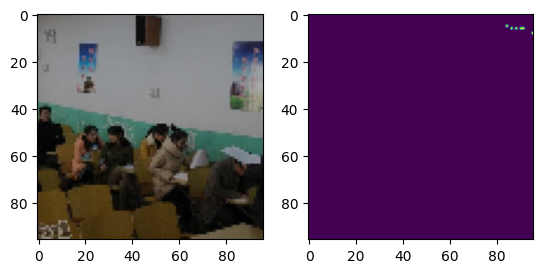

 10%|▉         | 105/1080 [00:35<05:49,  2.79it/s]

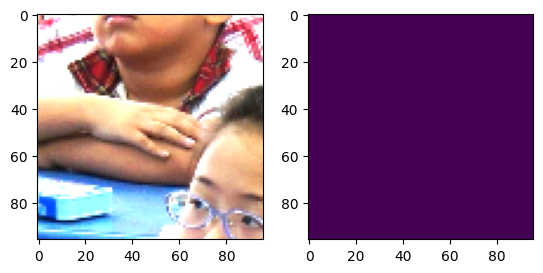

 10%|▉         | 106/1080 [00:36<05:43,  2.84it/s]

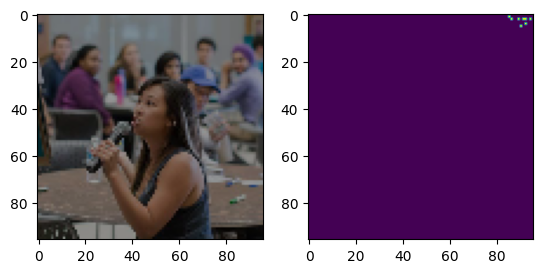

 10%|▉         | 107/1080 [00:36<05:37,  2.88it/s]

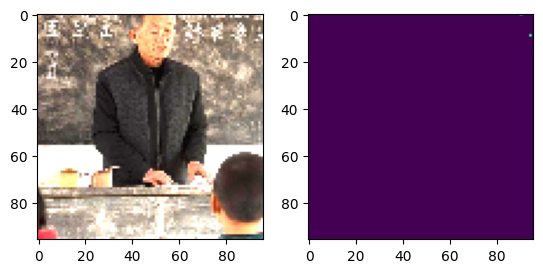

 10%|█         | 108/1080 [00:36<05:37,  2.88it/s]

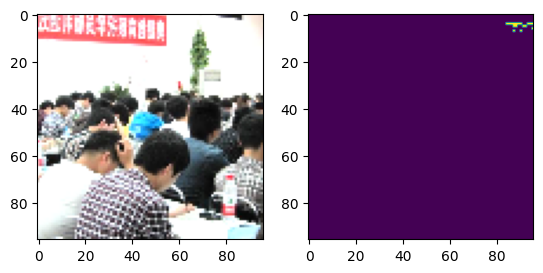

 10%|█         | 109/1080 [00:37<05:29,  2.95it/s]

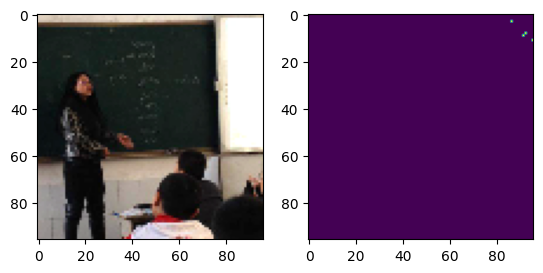

 10%|█         | 110/1080 [00:37<05:25,  2.98it/s]

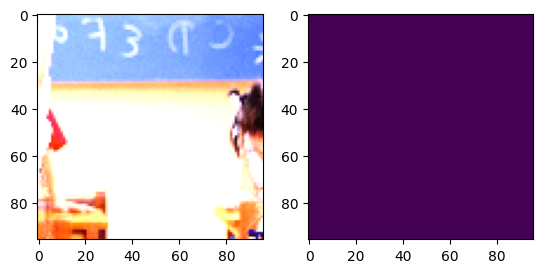

 10%|█         | 111/1080 [00:37<05:24,  2.99it/s]

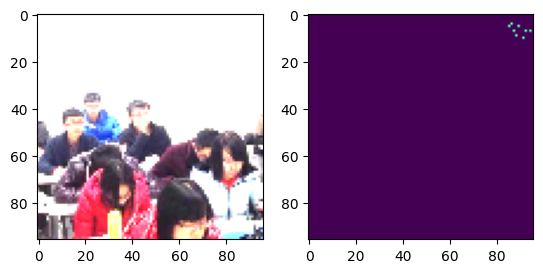

 10%|█         | 112/1080 [00:38<05:20,  3.02it/s]

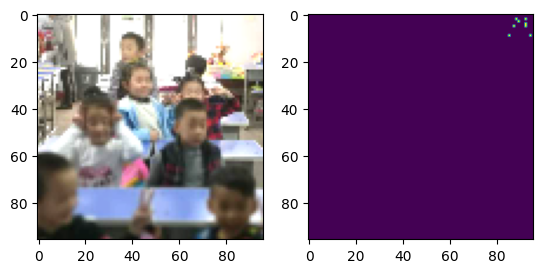

 10%|█         | 113/1080 [00:38<05:23,  2.99it/s]

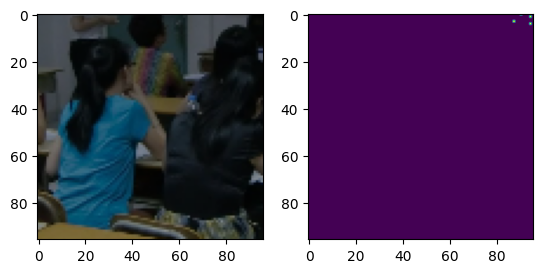

 11%|█         | 114/1080 [00:38<05:21,  3.00it/s]

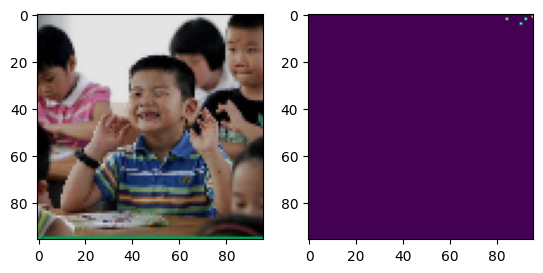

 11%|█         | 115/1080 [00:39<05:20,  3.01it/s]

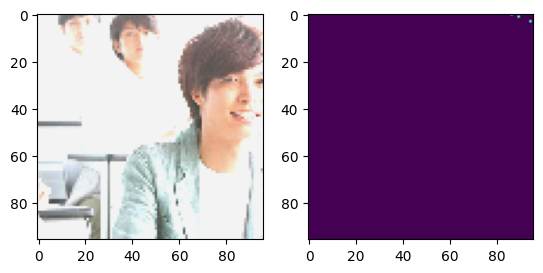

 11%|█         | 116/1080 [00:39<05:18,  3.03it/s]

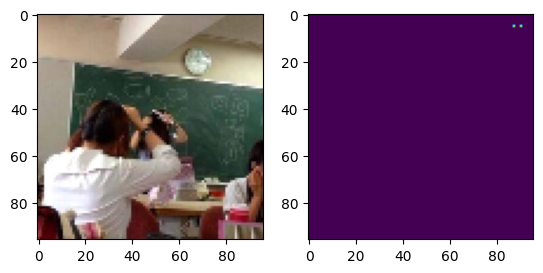

 11%|█         | 117/1080 [00:39<05:21,  3.00it/s]

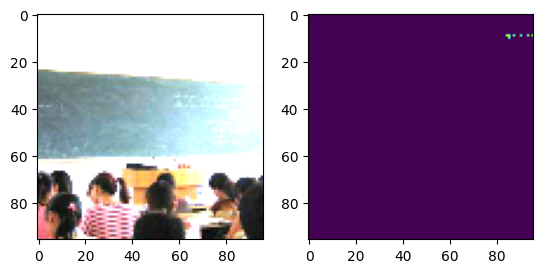

 11%|█         | 118/1080 [00:40<05:17,  3.03it/s]

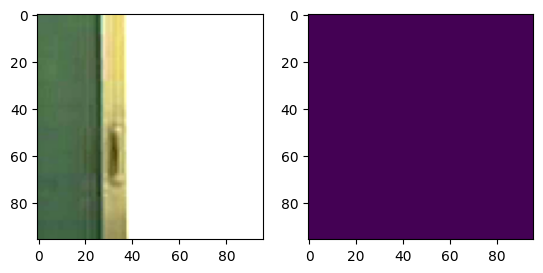

 11%|█         | 119/1080 [00:40<05:24,  2.96it/s]

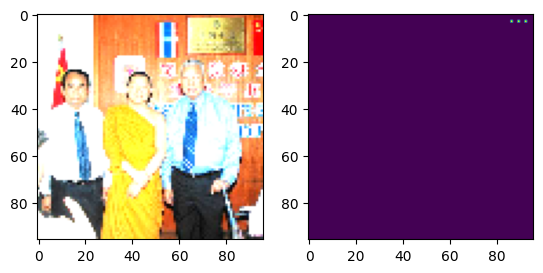

 11%|█         | 120/1080 [00:40<05:21,  2.98it/s]

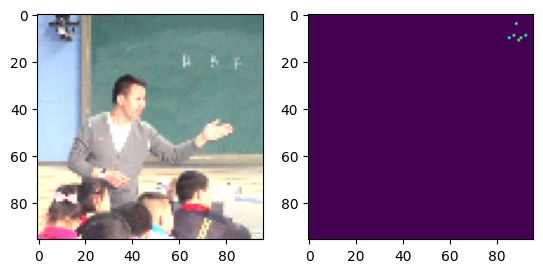

 11%|█         | 121/1080 [00:41<05:20,  3.00it/s]

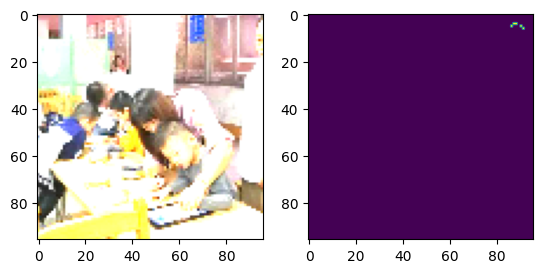

 11%|█▏        | 122/1080 [00:41<05:18,  3.01it/s]

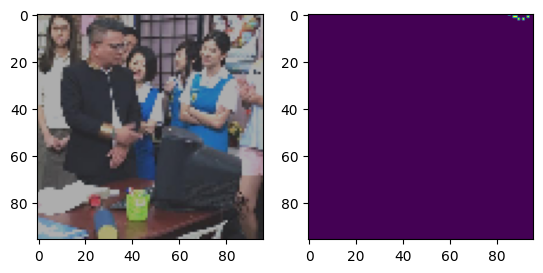

 11%|█▏        | 123/1080 [00:41<05:15,  3.03it/s]

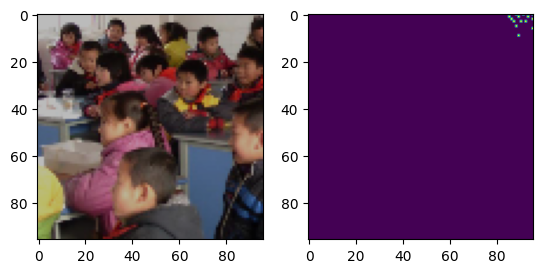

 11%|█▏        | 124/1080 [00:42<05:14,  3.04it/s]

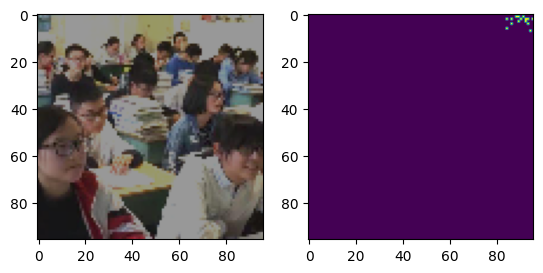

 12%|█▏        | 125/1080 [00:42<05:17,  3.01it/s]

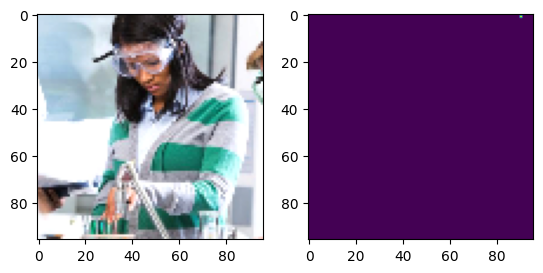

 12%|█▏        | 126/1080 [00:43<06:12,  2.56it/s]

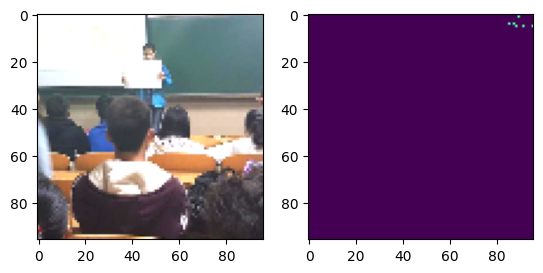

 12%|█▏        | 127/1080 [00:43<05:53,  2.69it/s]

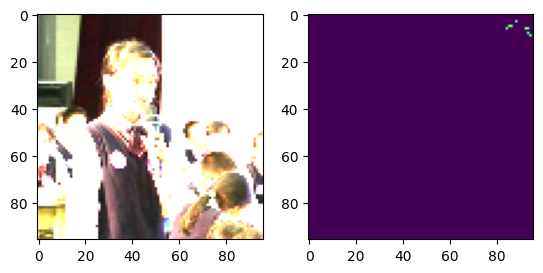

 12%|█▏        | 128/1080 [00:43<05:38,  2.81it/s]

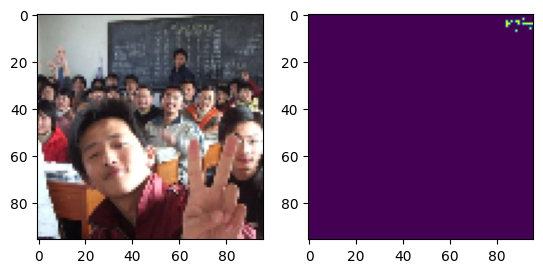

 12%|█▏        | 129/1080 [00:44<05:37,  2.82it/s]

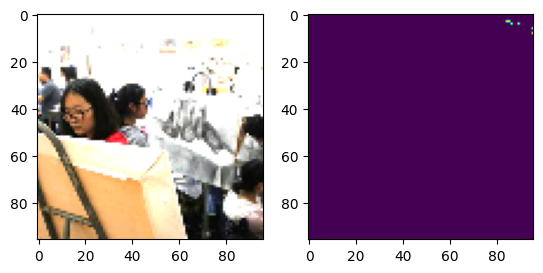

 12%|█▏        | 130/1080 [00:44<05:27,  2.90it/s]

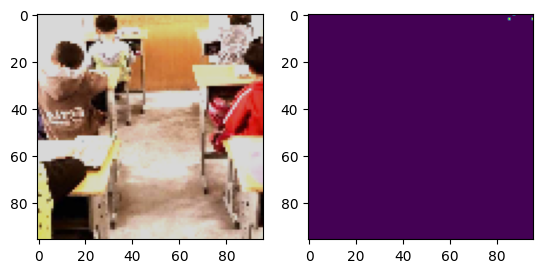

 12%|█▏        | 131/1080 [00:44<05:22,  2.95it/s]

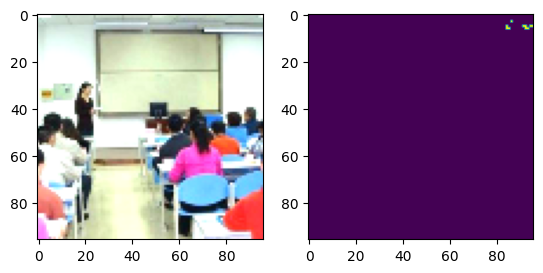

 12%|█▏        | 132/1080 [00:45<05:17,  2.98it/s]

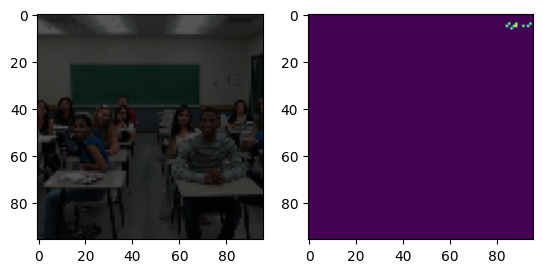

 12%|█▏        | 133/1080 [00:45<05:14,  3.01it/s]

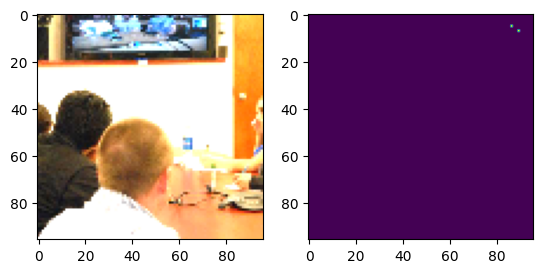

 12%|█▏        | 134/1080 [00:45<05:21,  2.94it/s]

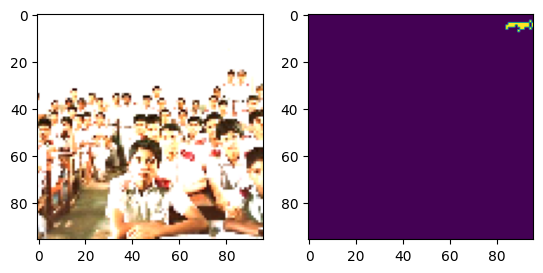

 12%|█▎        | 135/1080 [00:46<05:18,  2.97it/s]

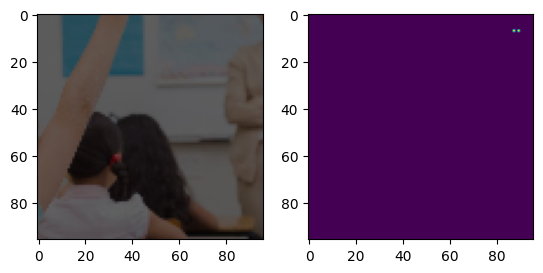

 13%|█▎        | 136/1080 [00:46<05:15,  2.99it/s]

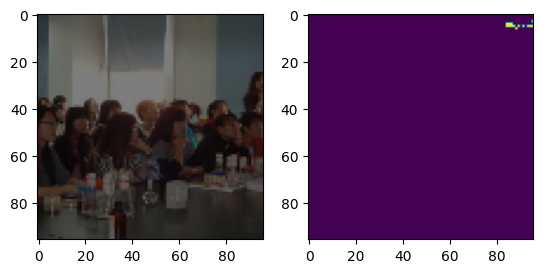

 13%|█▎        | 137/1080 [00:46<05:18,  2.96it/s]

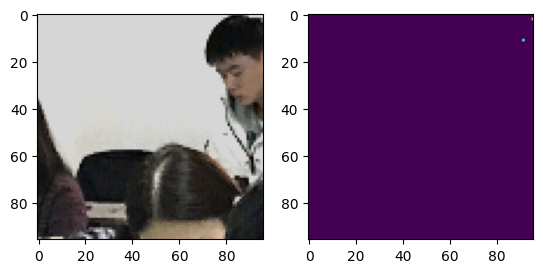

 13%|█▎        | 138/1080 [00:47<05:16,  2.98it/s]

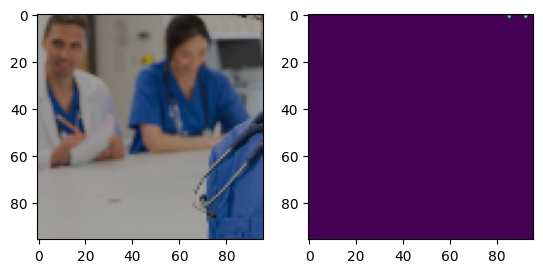

 13%|█▎        | 139/1080 [00:47<05:21,  2.93it/s]

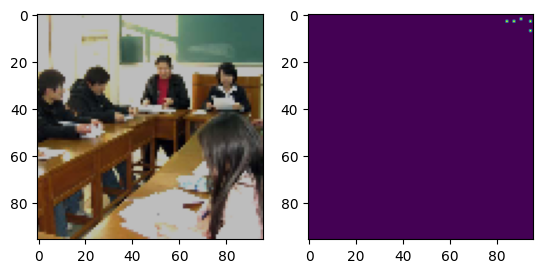

 13%|█▎        | 140/1080 [00:47<05:19,  2.95it/s]

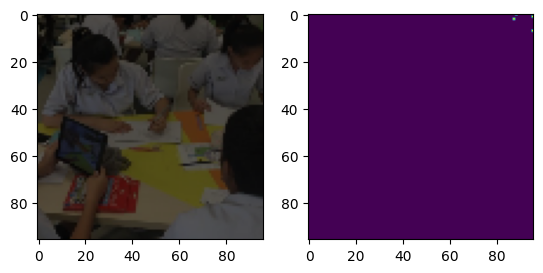

 13%|█▎        | 141/1080 [00:48<05:18,  2.95it/s]

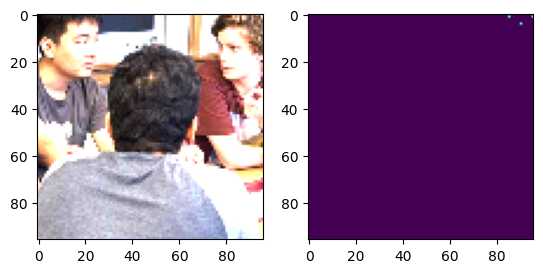

 13%|█▎        | 142/1080 [00:48<05:14,  2.98it/s]

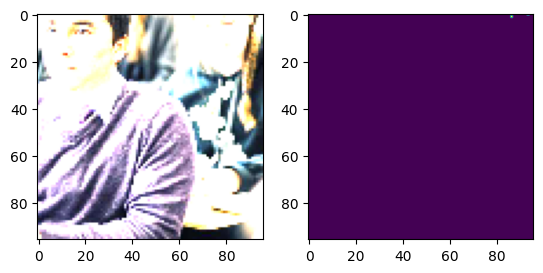

 13%|█▎        | 143/1080 [00:48<05:10,  3.02it/s]

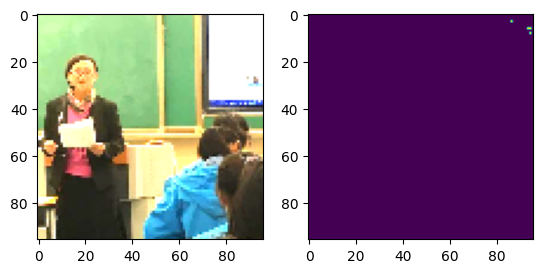

 13%|█▎        | 144/1080 [00:49<05:09,  3.03it/s]

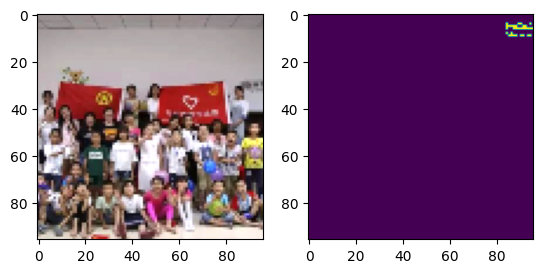

 13%|█▎        | 145/1080 [00:49<05:08,  3.04it/s]

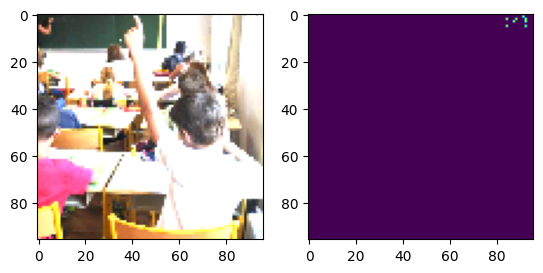

 14%|█▎        | 146/1080 [00:49<05:06,  3.05it/s]

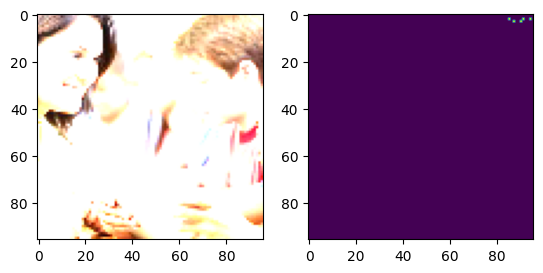

 14%|█▎        | 147/1080 [00:50<05:11,  3.00it/s]

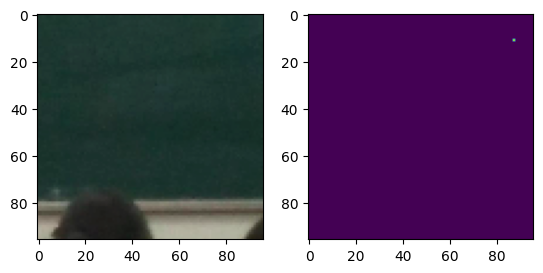

 14%|█▎        | 148/1080 [00:50<05:09,  3.01it/s]

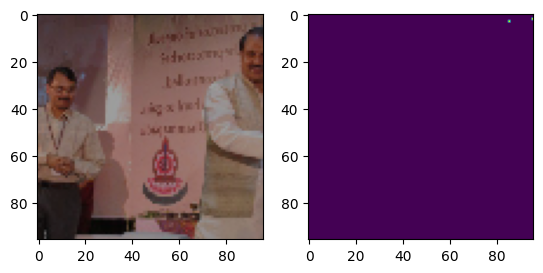

 14%|█▍        | 149/1080 [00:50<05:28,  2.83it/s]

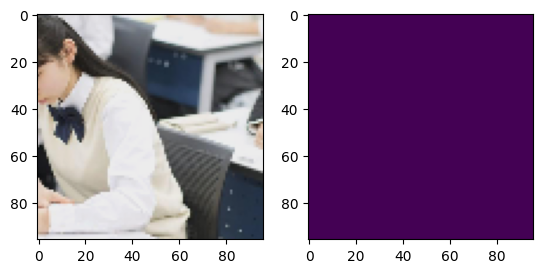

 14%|█▍        | 150/1080 [00:51<05:43,  2.71it/s]

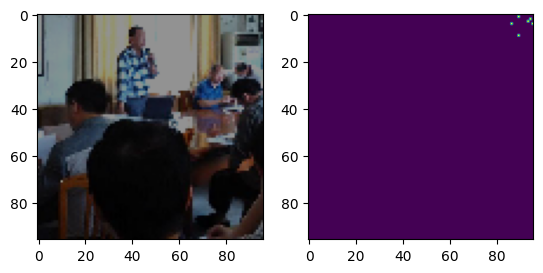

 14%|█▍        | 151/1080 [00:51<07:38,  2.03it/s]

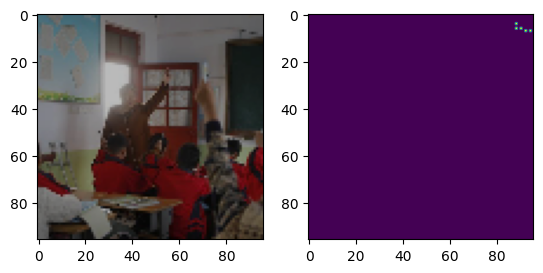

 14%|█▍        | 152/1080 [00:52<07:40,  2.01it/s]

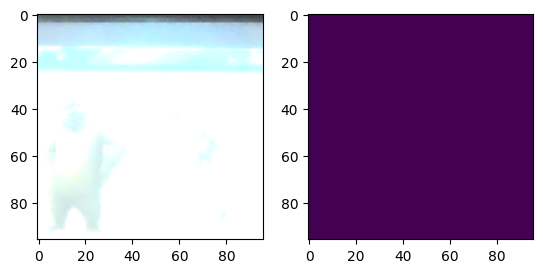

 14%|█▍        | 153/1080 [00:52<07:48,  1.98it/s]

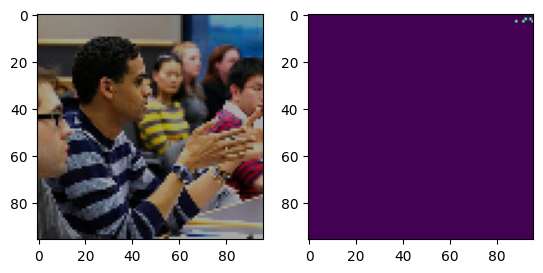

 14%|█▍        | 154/1080 [00:53<08:30,  1.82it/s]

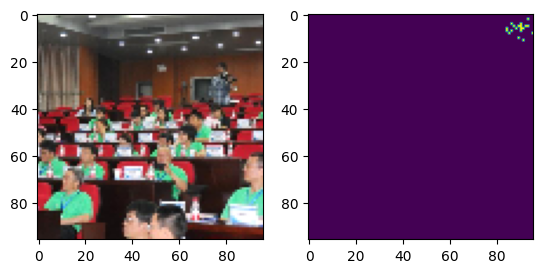

 14%|█▍        | 155/1080 [00:54<08:35,  1.79it/s]

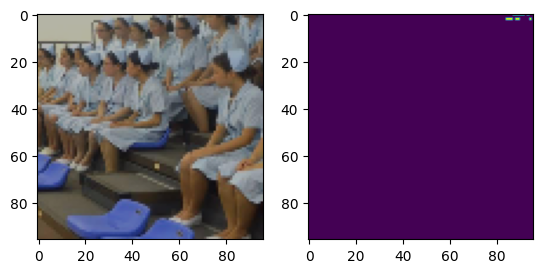

 14%|█▍        | 156/1080 [00:54<08:16,  1.86it/s]

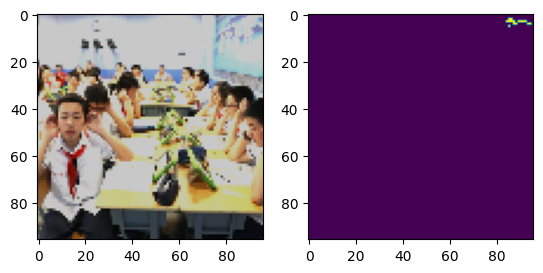

 15%|█▍        | 157/1080 [00:55<07:58,  1.93it/s]

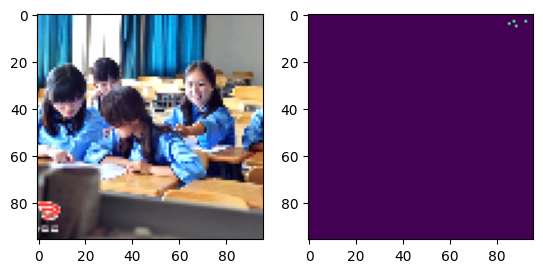

 15%|█▍        | 158/1080 [00:55<08:07,  1.89it/s]

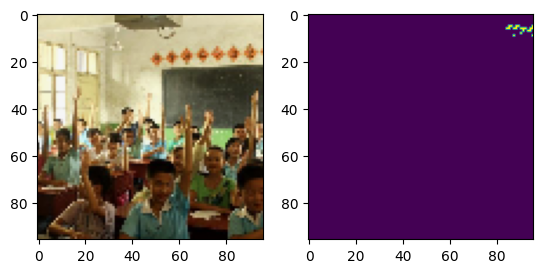

 15%|█▍        | 159/1080 [00:56<08:27,  1.81it/s]

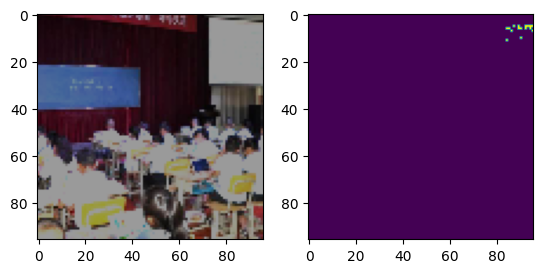

 15%|█▍        | 160/1080 [00:57<09:05,  1.69it/s]

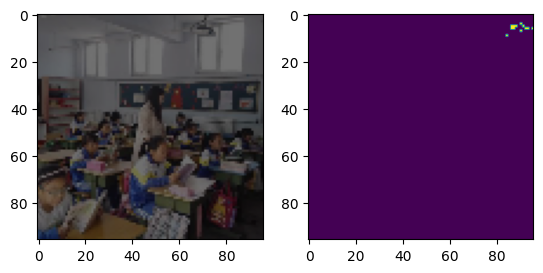

 15%|█▍        | 161/1080 [00:57<08:48,  1.74it/s]

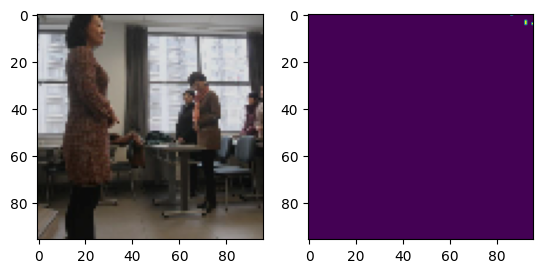

 15%|█▌        | 162/1080 [00:58<08:35,  1.78it/s]

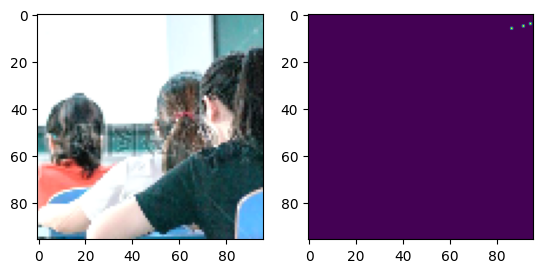

 15%|█▌        | 163/1080 [00:58<08:14,  1.86it/s]

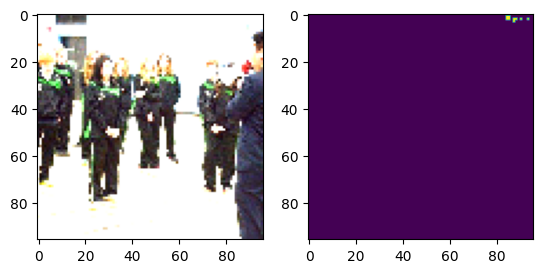

 15%|█▌        | 164/1080 [00:59<08:23,  1.82it/s]

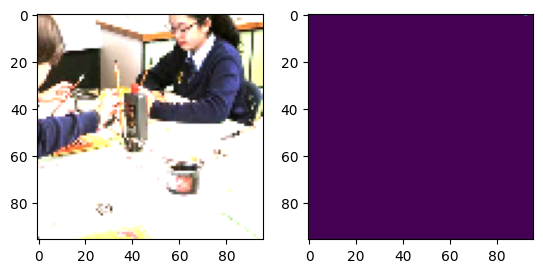

 15%|█▌        | 165/1080 [00:59<07:56,  1.92it/s]

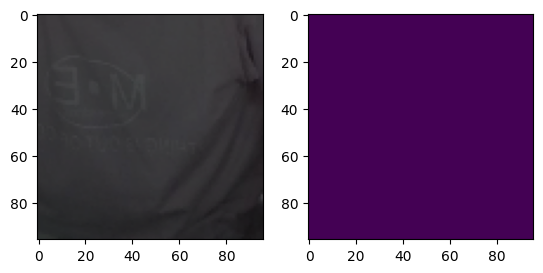

 15%|█▌        | 166/1080 [01:00<07:47,  1.96it/s]

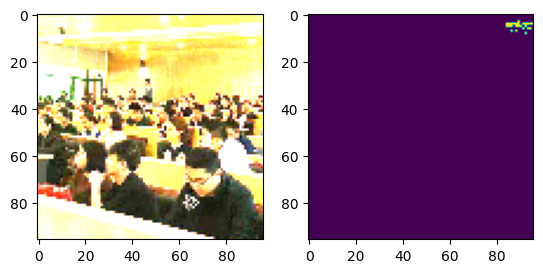

 15%|█▌        | 167/1080 [01:00<08:01,  1.90it/s]

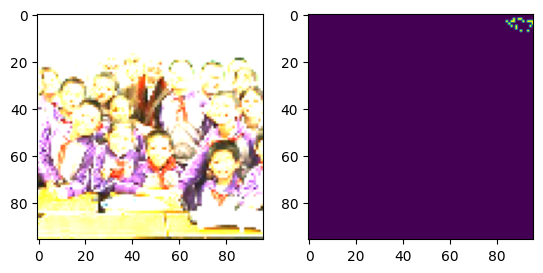

 16%|█▌        | 168/1080 [01:01<08:10,  1.86it/s]

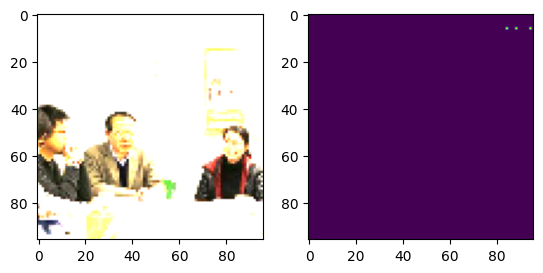

 16%|█▌        | 169/1080 [01:01<08:21,  1.82it/s]

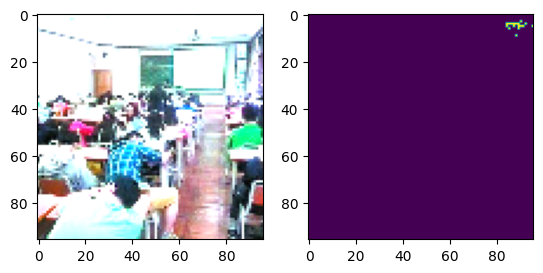

 16%|█▌        | 170/1080 [01:02<08:22,  1.81it/s]

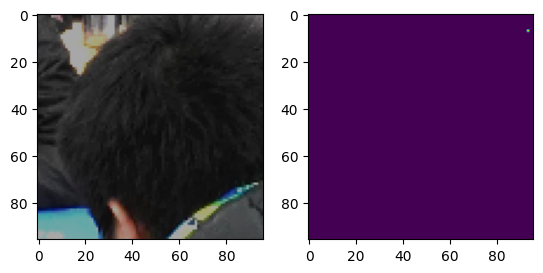

 16%|█▌        | 171/1080 [01:03<09:05,  1.67it/s]

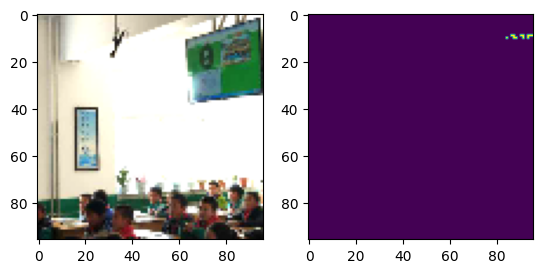

 16%|█▌        | 172/1080 [01:03<08:32,  1.77it/s]

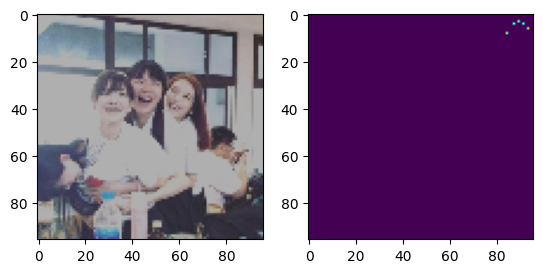

 16%|█▌        | 173/1080 [01:04<08:16,  1.83it/s]

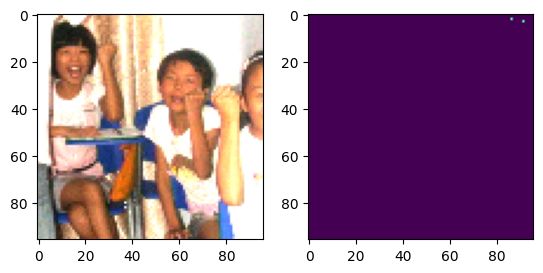

 16%|█▌        | 174/1080 [01:04<08:13,  1.83it/s]

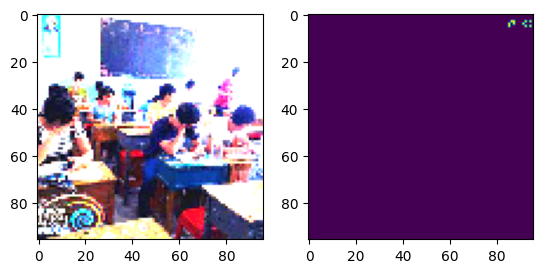

 16%|█▌        | 175/1080 [01:05<08:09,  1.85it/s]

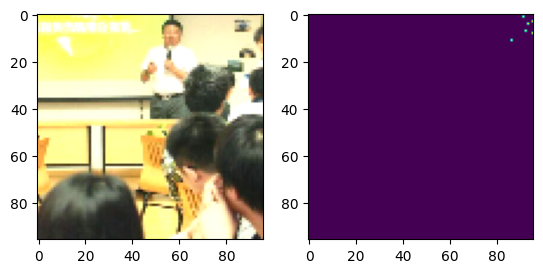

 16%|█▋        | 176/1080 [01:06<09:50,  1.53it/s]

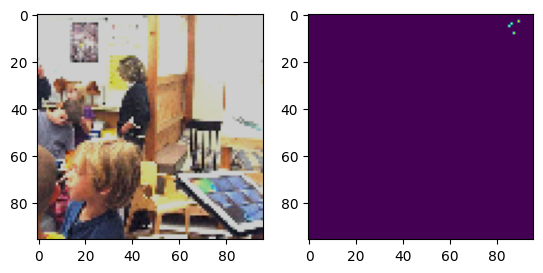

 16%|█▋        | 177/1080 [01:06<09:26,  1.59it/s]

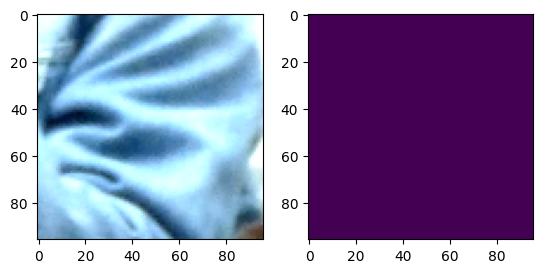

 16%|█▋        | 178/1080 [01:07<09:07,  1.65it/s]

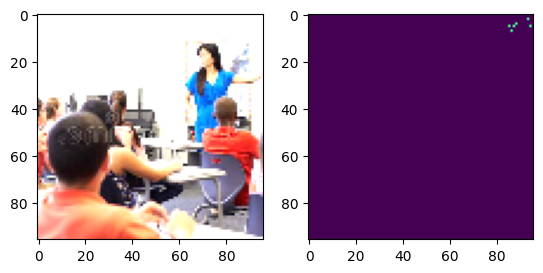

 17%|█▋        | 179/1080 [01:07<08:54,  1.69it/s]

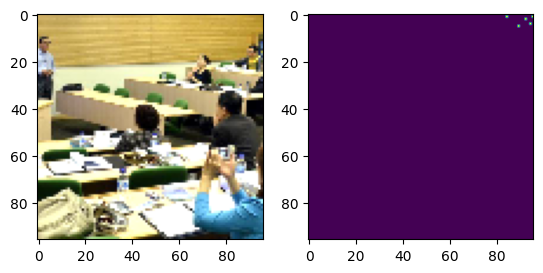

 17%|█▋        | 180/1080 [01:08<08:32,  1.76it/s]

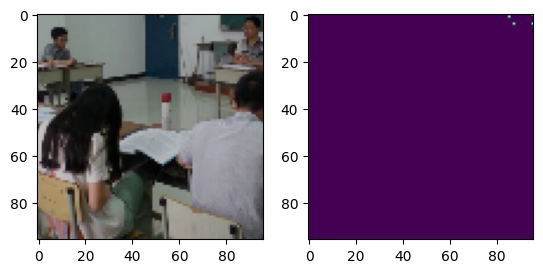

 17%|█▋        | 181/1080 [01:08<08:40,  1.73it/s]

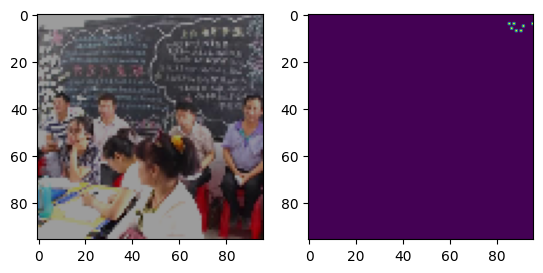

 17%|█▋        | 182/1080 [01:09<08:40,  1.72it/s]

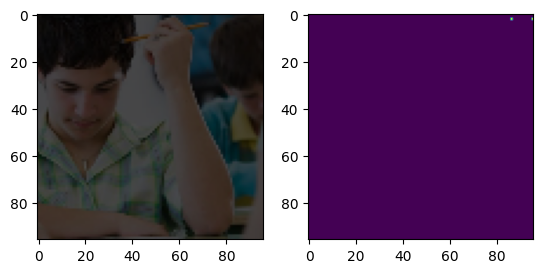

 17%|█▋        | 183/1080 [01:09<08:06,  1.84it/s]

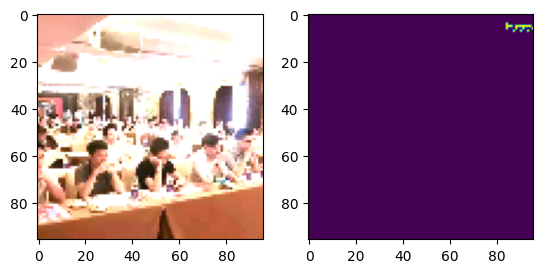

 17%|█▋        | 184/1080 [01:10<07:51,  1.90it/s]

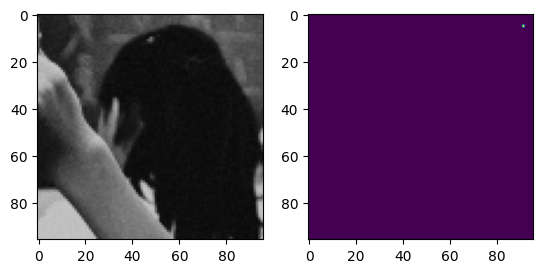

 17%|█▋        | 185/1080 [01:10<07:37,  1.96it/s]

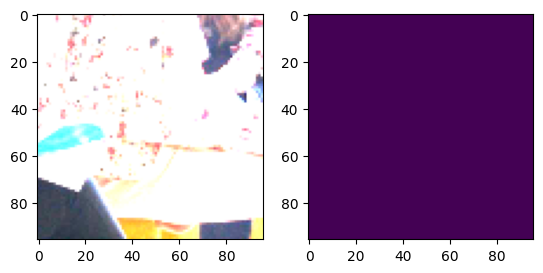

 17%|█▋        | 186/1080 [01:11<07:26,  2.00it/s]

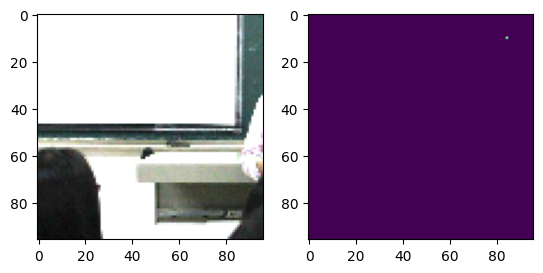

 17%|█▋        | 187/1080 [01:11<07:26,  2.00it/s]

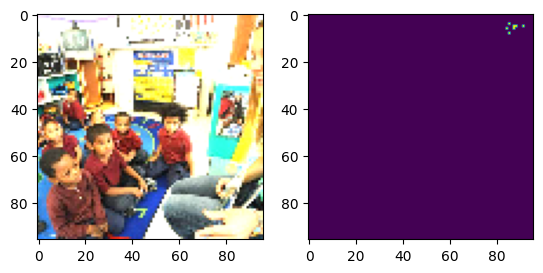

 17%|█▋        | 188/1080 [01:12<07:02,  2.11it/s]

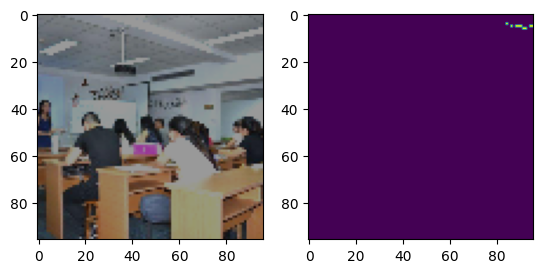

 18%|█▊        | 189/1080 [01:12<07:23,  2.01it/s]

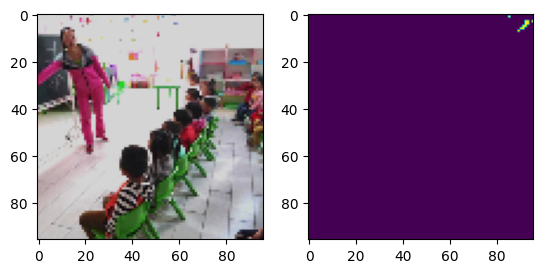

 18%|█▊        | 190/1080 [01:13<07:18,  2.03it/s]

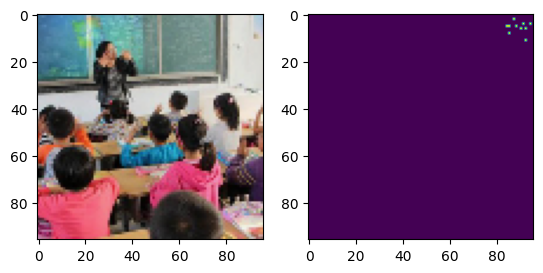

 18%|█▊        | 191/1080 [01:13<07:15,  2.04it/s]

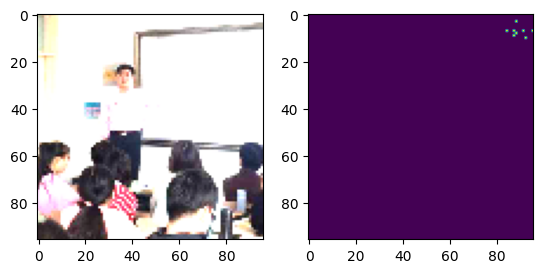

 18%|█▊        | 192/1080 [01:14<07:12,  2.05it/s]

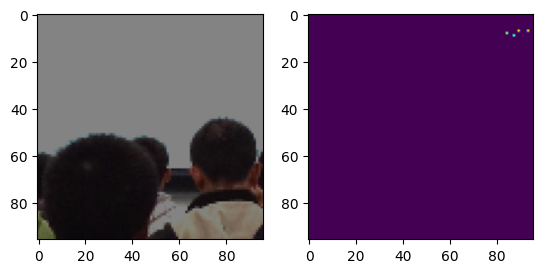

 18%|█▊        | 193/1080 [01:14<07:05,  2.08it/s]

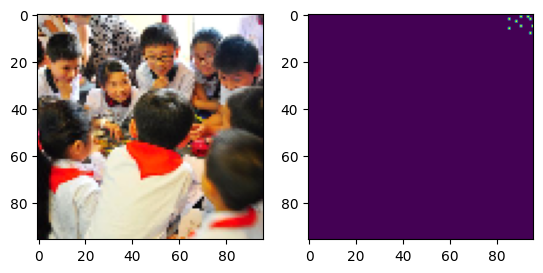

 18%|█▊        | 194/1080 [01:15<07:07,  2.07it/s]

In [9]:
# データセット
x_train = []
y_train = []
x_test = []
y_test = []
x_valid = []
y_valid = []
semantic_label_size = INPUT_SIZE
trans_lst = []
center = (INPUT_SIZE[0] / 2, INPUT_SIZE[1] / 2)
scale = 1.0
for i in [theta for theta in range(0, 11, 10)]:
    trans_lst.append(cv2.getRotationMatrix2D(center, i, scale))

    # for dir in ["train", "valid"]:
dataset = []
for path in os.listdir(DATA_DIR):
    path = os.path.join(DATA_DIR, path)
    with h5py.File(path, "r") as f:
        img = f["img"][:]
        label = f["label"][:]
    dataset.append((img, label))
random_idx = list(range(0, len(dataset)))

# データをランダムに取得するためのインデックス
random.shuffle(random_idx)
# データ取得。データ数が少ないため、auguentationを行う。回転、反転、明るさ調整を行い、学習データに追加。
positive_count = 0
for i, idx in enumerate(tqdm(random_idx)):
    img, label = dataset[idx]
    if i < len(random_idx) * 0.9:
        if np.any(label == 1):
            positive_count += 1
        # else:
        #     continue
        for trans in trans_lst:
            img_trans = cv2.warpAffine(img, trans, semantic_label_size)
            label_trans = cv2.warpAffine(label, trans, semantic_label_size)
            img_trans = func.augment_brightness(img_trans)
            x_train.append(img_trans)
            y_train.append(cv2.resize(label_trans, semantic_label_size))
            img_trans = np.fliplr(img_trans)
            img_trans = func.augment_brightness(img_trans)
            x_train.append(img_trans)
            y_train.append(cv2.resize(np.fliplr(label_trans), semantic_label_size))
            plt.subplot(1,2,1)
            plt.imshow(img_trans)
            plt.subplot(1,2,2)
            plt.imshow(y_train[-1])
            plt.show()
            break
        # img_trans = img
        # img_trans = func.augment_brightness(img_trans)
        # x_train.append(img_trans)
        # y_train.append(cv2.resize(label, semantic_label_size))
        # img_trans = np.fliplr(img_trans)
        # img_trans = func.augment_brightness(img_trans)
        # x_train.append(img_trans)
        # y_train.append(cv2.resize(np.fliplr(label), semantic_label_size))
    else:
        x_valid.append(img)
        y_valid.append(cv2.resize(label, semantic_label_size))

3888 108


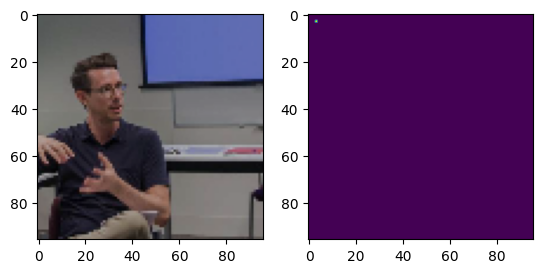

In [6]:
print(len(x_train), len(x_valid))
plt.subplot(1, 2, 1)
plt.imshow(x_train[0])
plt.subplot(1, 2, 2)
plt.imshow(y_train[0])
plt.show()

In [4]:

x_train = np.array(x_train) / 255
y_train = np.array(y_train)
x_test = np.array(x_test) / 255
y_test = np.array(y_test)
x_valid = np.array(x_valid) / 255
y_valid = np.array(y_valid)

# モデルの定義

In [5]:

mobilenet = MobileNetV2(
    input_shape=(INPUT_SIZE[0], INPUT_SIZE[1], INPUT_CHANNEL),
    include_top=False,
    alpha=ALPHA,
    weights="imagenet",
)
mobilenet.summary()
complessed_mobilenet = Model(
    inputs=mobilenet.input, outputs=mobilenet.get_layer("block_6_expand_relu").output
)
for layer in complessed_mobilenet.layers:
    layer.trainable = False


semantic_model= tf.keras.models.Sequential(
    [
        complessed_mobilenet,
        Conv2D(
            filters=32,
            kernel_size=1,
            strides=1,
            padding="same",
            activation="relu",
        ),
        tf.keras.layers.BatchNormalization(),
        Conv2D(
            filters=32,
            kernel_size=1,
            strides=1,
            padding="same",
            activation="relu",
        ),
        tf.keras.layers.BatchNormalization(),
        Conv2D(
            filters=1,
            kernel_size=1,
            strides=1,
            padding="same",
            activation="sigmoid",
        ),
        tf.keras.layers.UpSampling2D(size=(2,2), interpolation="bilinear"), # 24
        Conv2D(
            filters=64,
            kernel_size=1,
            strides=1,
            padding="same",
            activation="relu",
        ),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.UpSampling2D(size=(2,2), interpolation="bilinear"),# 48
        Conv2D(
            filters=32,
            kernel_size=1,
            strides=1,
            padding="same",
            activation="relu",
        ),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.UpSampling2D(size=(2,2), interpolation="bilinear"),# 96
        Conv2D(
            filters=1,
            kernel_size=1,
            strides=1,
            padding="same",
            activation="sigmoid",
        ),]

)

semantic_model.summary()

Model: "mobilenetv2_0.75_96"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 96, 96, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 48, 48, 24)   648         ['input_1[0][0]']                
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 48, 48, 24)   96          ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReLU)              (None, 48, 48, 24)   0           ['bn_Conv1[0][0]']               
                                                                                

# 学習

In [6]:
semantic_model.compile(
    loss=loss.DiceLoss,
    optimizer=Adam(learning_rate=0.001),
    metrics=[loss.IoU],
)

semantic_model.fit(
    x_train,
    y_train,
    batch_size=32,
    epochs=50,
    validation_data=(x_valid, y_valid),
)

Epoch 1/50
135/135 [==============================] - 5s 12ms/step - loss: 0.7559 - IoU: 0.1427 - val_loss: 0.9899 - val_IoU: 0.0051
Epoch 2/50
135/135 [==============================] - 1s 8ms/step - loss: 0.3674 - IoU: 0.4681 - val_loss: 1.0000 - val_IoU: 5.7714e-06
Epoch 3/50
135/135 [==============================] - 1s 8ms/step - loss: 0.2490 - IoU: 0.6019 - val_loss: 1.0000 - val_IoU: 6.6521e-06
Epoch 4/50
135/135 [==============================] - 1s 8ms/step - loss: 0.2283 - IoU: 0.6289 - val_loss: 0.7093 - val_IoU: 0.1701
Epoch 5/50
135/135 [==============================] - 1s 8ms/step - loss: 0.2177 - IoU: 0.6430 - val_loss: 0.3121 - val_IoU: 0.5243
Epoch 6/50
135/135 [==============================] - 1s 8ms/step - loss: 0.2120 - IoU: 0.6506 - val_loss: 0.1992 - val_IoU: 0.6678
Epoch 7/50
135/135 [==============================] - 1s 9ms/step - loss: 0.2068 - IoU: 0.6576 - val_loss: 0.2384 - val_IoU: 0.6149
Epoch 8/50
135/135 [==============================] - 1s 8ms/step -

# テスト

In [7]:
import shutil
test_img_lst = os.listdir("test")
test_result_dir = "test_result"
if os.path.exists(test_result_dir):
    shutil.rmtree(test_result_dir)
os.mkdir(test_result_dir)

In [8]:

for i, img_name in enumerate(test_img_lst):
    img_path = os.path.join("test", img_name)
    img = cv2.imread(img_path)
    img = cv2.resize(img, INPUT_SIZE)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = np.expand_dims(img, axis=0)
    img = img / 255
    pred = semantic_model.predict(img)
    pred = np.squeeze(pred)
    pred = np.where(pred > 0.5, 1, 0)
    plt.subplot(1, 2, 1)
    plt.imshow(img[0])
    plt.subplot(1, 2, 2)
    plt.imshow(pred)
    plt.savefig(os.path.join(test_result_dir, img_name))
    plt.close()

# モデルの変換
### 粗いセグメンテーションを実装するために、モデルを途中でちょん切る

In [9]:
def get_name_spresense_output_layer(model, idx_ketu):
    layer_name = model.layers[idx_ketu].name
    return layer_name

spresense_output_layer_name = get_name_spresense_output_layer(semantic_model, 5)
spresense_output_layer_name

'conv2d_2'

In [10]:

semantic_model.summary()
spresense_model = Model(
    inputs=semantic_model.input, outputs=semantic_model.get_layer(spresense_output_layer_name).output
)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 model (Functional)          (None, 12, 12, 144)       48928     
                                                                 
 conv2d (Conv2D)             (None, 12, 12, 32)        4640      
                                                                 
 batch_normalization (BatchN  (None, 12, 12, 32)       128       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 12, 12, 32)        1056      
                                                                 
 batch_normalization_1 (Batc  (None, 12, 12, 32)       128       
 hNormalization)                                                 
                                                                 
 conv2d_2 (Conv2D)           (None, 12, 12, 1)         3

In [16]:

test_sprit_result_dir = "test_sprit_result" 
if os.path.exists(test_sprit_result_dir):
    shutil.rmtree(test_sprit_result_dir)
os.mkdir(test_sprit_result_dir)
for img_name in test_img_lst[::-1 ]:
    img_path = os.path.join("test", img_name)
    img = cv2.imread(img_path)
    img = cv2.resize(img, INPUT_SIZE)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = np.expand_dims(img, axis=0)
    img = img / 255
    pred = spresense_model.predict(img)
    pred = np.squeeze(pred)
    # pred_stats = scipy.stats.describe(pred, axis=None)
    mask_pred = np.where(pred >0.5, 1, 0)
    plt.subplot(1, 3, 1)
    plt.imshow(img[0])
    plt.subplot(1, 3, 2)
    plt.imshow(mask_pred)
    plt.subplot(1, 3, 3)
    plt.imshow(pred, vmin=0, vmax=1)
    # cbar = plt.colorbar(pred, ax=plt.gca())
    # cbar.set_label('Colorbar Label')  # カラーバーのラベルを設定
    # plt.show()
    plt.savefig(os.path.join(test_sprit_result_dir, img_name))
    plt.close()

# spresense用にモデル変換

In [17]:

if os.path.exists(MODEL_DIR) == False:
    os.mkdir(MODEL_DIR)
spresense_model.save(FULL_MODEL_PATH)
conveter = tf.lite.TFLiteConverter.from_keras_model(spresense_model)
tflite_model = conveter.convert()
float_model_size = len(tflite_model) / 1024 / 1024
print(f"float model size: {float_model_size} MB")
open(TFLITE_MODEL_PATH, "wb").write(tflite_model)


import binascii


def convert_to_c_array(bytes) -> str:
    hexstr = binascii.hexlify(bytes).decode("UTF-8")
    hexstr = hexstr.upper()
    array = ["0x" + hexstr[i : i + 2] for i in range(0, len(hexstr), 2)]
    array = [array[i : i + 10] for i in range(0, len(array), 10)]
    return ",\n  ".join([", ".join(e) for e in array])


tflite_binary = open(TFLITE_MODEL_PATH, "rb").read()
ascii_bytes = convert_to_c_array(tflite_binary)
header_file = (
    "const unsigned char model_tflite[] = {\n  "
    + ascii_bytes
    + "\n};\nunsigned int model_tflite_len = "
    + str(len(tflite_binary))
    + ";"
)
# print(c_file)
open(HEADER_MODEL_PATH, "w").write(header_file)
open(SPRESENSE_HEADER_MODEL_PATH, "w").write(header_file)

INFO:tensorflow:Assets written to: C:\Users\oosim\AppData\Local\Temp\tmphr9_l2yo\assets


INFO:tensorflow:Assets written to: C:\Users\oosim\AppData\Local\Temp\tmphr9_l2yo\assets


float model size: 0.20481491088867188 MB


1331618

In [18]:
print("--------start quantization--------")


def representative_dataset_gen():
    for i in range(len(x_valid)):
        input_image = tf.cast(x_valid[i], tf.float32)
        input_image = tf.reshape(
            input_image, [1, INPUT_SIZE[0], INPUT_SIZE[1], INPUT_CHANNEL]
        )
        yield ([input_image])


converter = tf.lite.TFLiteConverter.from_keras_model(spresense_model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.representative_dataset = representative_dataset_gen
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS_INT8]
# converter.inference_input_type = tf.int8
# converter.inference_output_type = tf.int8
tflite_quant_model = converter.convert()

tflite_quant_model_path = os.path.join(MODEL_DIR, "model_quant.tflite")
with open(tflite_quant_model_path, "wb") as f:
    f.write(tflite_quant_model)
spresense_quant_model_path = os.path.join(MODEL_DIR, "spresense_model_quant.h")
tflite_binary = open(tflite_quant_model_path, "rb").read()
ascii_bytes = convert_to_c_array(tflite_binary)
header_file = (
    "const unsigned char model_tflite[] = {\n  "
    + ascii_bytes
    + "\n};\nunsigned int model_tflite_len = "
    + str(len(tflite_binary))
    + ";"
)

open(HEADER_QUANT_MODEL_PATH, "w").write(header_file)
open(SPRESENSE_HEADER_QUANT_MODEL_PATH, "w").write(header_file)


--------start quantization--------
INFO:tensorflow:Assets written to: C:\Users\oosim\AppData\Local\Temp\tmp7bydpvr5\assets


INFO:tensorflow:Assets written to: C:\Users\oosim\AppData\Local\Temp\tmp7bydpvr5\assets
c:\Users\oosim\Anaconda3\envs\fuc\lib\site-packages\tensorflow\lite\python\convert.py:746: UserWarning: Statistics for quantized inputs were expected, but not specified; continuing anyway.
  warnings.warn("Statistics for quantized inputs were expected, but not "


713378